# Momentum Shift Visualizer (Expanded Data)
# Entry Strategy: WMA 8 Zero-Line Cross + RSI > 50 + WMA 21 Slope > 0 + RSI(5,14,34) < 68
# Target: +5% | Max Days: 21 | Cost: 0.24% Round-Trip Fees

In [1]:
# 1. Imports and Setup
import pandas as pd
import numpy as np
import os
import glob
import random
import matplotlib.pyplot as plt
from IPython.display import display, HTML
import warnings

warnings.filterwarnings('ignore')
display(HTML("<style>.container { width:100% !important; }</style>"))
plt.rcParams['figure.figsize'] = (24, 12)

DATA_DIR = r'D:\0dot1_Aug_2016_master\data\mstock_mtf_daily_data'

In [2]:
# 2. Backtest Engine & Indicator Logic
def calc_rsi(series, period):
    delta = series.diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=period).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=period).mean()
    rs = gain / loss
    return 100 - (100 / (1 + rs))

def calc_wma(series, period):
    weights = np.arange(1, period + 1)
    return series.rolling(period).apply(lambda x: np.dot(x, weights) / weights.sum(), raw=True)

def backtest_ema_single(df, take_profit, time_stop, stop_loss=-0.07):
    trades = []
    in_trade = False
    entry_price = 0
    entry_date = None
    days_held = 0
    entry_row = None
    lowest_price = float('inf')
    
    for i in range(len(df)):
        row = df.iloc[i]
        
        if pd.isna(row['EMA_55']) or pd.isna(row['EMA_221']):
            continue
            
        if in_trade:
            days_held += 1
            lowest_price = min(lowest_price, row.get('Low', row['Close']))
            exit_triggered = False
            exit_reason = ""
            
            # Apply realistic Indian Swing Trading Costs (0.12% per leg = 0.24% Round Trip)
            fee_rate = 0.0012
            buy_cost = entry_price * (1 + fee_rate)
            sell_revenue = row['Close'] * (1 - fee_rate)
            
            # Actual realized return in pocket
            realized_profit_pct = (sell_revenue - buy_cost) / buy_cost
            
            # Nominal return used just to check the raw chart target
            nominal_profit_pct = (row['Close'] - entry_price) / entry_price
            
            if nominal_profit_pct >= take_profit:
                exit_triggered = True
                exit_reason = "Take Profit (+5%)"
            elif nominal_profit_pct <= stop_loss:
                exit_triggered = True
                exit_reason = "Stop Loss (-7%)"
            elif days_held >= time_stop:
                exit_triggered = True
                exit_reason = f"Time Stop ({time_stop}d)"
            
            if exit_triggered:
                trades.append({
                    'Symbol': row['Symbol'],
                    'Entry_Date': entry_date,
                    'Entry_Price': entry_price,
                    'Exit_Date': row['Date'],
                    'Exit_Price': row['Close'],
                    'Return': realized_profit_pct,
                    'Drawdown': (lowest_price - entry_price) / entry_price,
                    'Reason': exit_reason,
                    'Entry_RSI_5': entry_row['RSI_5'],
                    'Entry_RSI_14': entry_row['RSI_14'],
                    'Entry_RSI_34': entry_row['RSI_34'],
                    'Entry_EMA_55': entry_row['EMA_55'],
                    'Entry_EMA_221': entry_row['EMA_221']
                })
                in_trade = False
                days_held = 0
                lowest_price = float('inf')
                
        if not in_trade and row['Setup_Signal']:
            in_trade = True
            entry_price = row['Close']
            entry_date = row['Date']
            entry_row = row
            
    return pd.DataFrame(trades)


In [3]:
# 3. Data Loading & Execution
all_data = []
all_trades = []

files = glob.glob(os.path.join(DATA_DIR, '*.csv'))
random.seed(123)
random.shuffle(files)

loaded = 0
for file_path in files:
    if loaded >= 25: # Load 25 stocks
        break
        
    symbol = os.path.basename(file_path).replace('.csv', '')
    try:
        df = pd.read_csv(file_path).dropna(subset=['Close'])
        df['Date'] = pd.to_datetime(df['Date'])
        df = df.sort_values('Date').reset_index(drop=True)
        
        if len(df) < 500:
            continue
            
        latest_price = df['Close'].iloc[-1]
        if not (90 <= latest_price <= 600):
            continue
            
        # Calculate EMA 221 (on all data to avoid NaNs)
        df['EMA_221'] = df['Close'].ewm(span=221, adjust=False).mean()
        df['WMA_8'] = calc_wma(df['Close'], 8)
        df['WMA_21'] = calc_wma(df['Close'], 21)
        
        # Calculate Slopes (1-day diff)
        df['Slope_WMA_8'] = df['WMA_8'].diff()
        df['Slope_WMA_21'] = df['WMA_21'].diff()
        df['Slope_EMA_221'] = df['EMA_221'].diff()
        
        # Calculate RSI
        df['RSI_5'] = calc_rsi(df['Close'], 5)
        df['RSI_14'] = calc_rsi(df['Close'], 14)
        df['RSI_34'] = calc_rsi(df['Close'], 34)
        
        df['Prev_Slope_WMA_8'] = df['Slope_WMA_8'].shift(1)
        
        # Entry Filters (Momentum Shift Strategy)
        regime = df['Close'] > df['EMA_221']
        setup = df['Prev_Slope_WMA_8'] < 0
        trigger = df['Slope_WMA_8'] > 0
        rsi_confirm = df['RSI_14'] > 50
        med_momentum = df['Slope_WMA_21'] > 0
        
        anti_exhaustion = (df['RSI_5'] < 68) & (df['RSI_14'] < 68) & (df['RSI_34'] < 68)
        
        df['Setup_Signal'] = regime & setup & trigger & rsi_confirm & med_momentum & anti_exhaustion
        
        # Filter to 2 Full Years (Jan 2023 - Dec 2024)
        df = df[(df['Date'] >= '2023-01-01') & (df['Date'] <= '2024-12-31')].reset_index(drop=True)
        
        if len(df) < 100:
            continue
            
        df['Symbol'] = symbol
        
        # We need EMA_55 to prevent KeyError in our backtest engine logging
        df['EMA_55'] = df['Close'].ewm(span=55, adjust=False).mean()
        
        trades_df = backtest_ema_single(df, take_profit=0.05, time_stop=21)
        
        if trades_df.empty:
            continue # Force script to find stocks that actually have trades in this window
            
        all_data.append(df)
        all_trades.append(trades_df)
        loaded += 1
    except Exception as e:
        pass

full_trades_df = pd.concat(all_trades, ignore_index=True) if all_trades else pd.DataFrame()

display(HTML("<h3>Trade Log (July-Dec 2023)</h3>"))
if not full_trades_df.empty:
    wins = len(full_trades_df[full_trades_df['Return'] > 0])
    total = len(full_trades_df)
    win_rate = (wins / total) * 100
    avg_return = full_trades_df['Return'].mean() * 100
    
    display(HTML(f"<ul><li><b>Total Trades:</b> {total}</li><li><b>Win Rate:</b> {win_rate:.2f}%</li><li><b>Average Return:</b> {avg_return:.2f}%</li></ul>"))
    
    styled_df = full_trades_df.style.format({
        'Entry_Price': '{:.2f}', 
        'Exit_Price': '{:.2f}', 
        'Return': '{:.2%}',
        'Entry_RSI_5': '{:.1f}',
        'Entry_RSI_14': '{:.1f}',
        'Entry_RSI_34': '{:.1f}',
        'Entry_EMA_55': '{:.2f}',
        'Entry_EMA_221': '{:.2f}'
    })
    display(styled_df)
else:
    print("No trades found.")


,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
0,BERGEPAINT,2023-05-22 00:00:00,521.83,2023-06-13 00:00:00,557.62,6.60%,-0.003354,Take Profit (+5%),45.2,58.2,64.0,499.59,508.64
1,BERGEPAINT,2023-07-31 00:00:00,568.67,2023-08-29 00:00:00,600.38,5.32%,-0.007107,Take Profit (+5%),41.9,59.4,59.9,549.85,525.91
2,BERGEPAINT,2023-09-06 00:00:00,596.46,2023-09-21 00:00:00,627.71,4.99%,-0.013413,Take Profit (+5%),50.2,57.8,58.5,574.52,539.22
3,BERGEPAINT,2023-12-14 00:00:00,580.05,2024-01-15 00:00:00,602.75,3.66%,-0.028273,Time Stop (21d),34.0,54.1,54.1,576.07,556.60
4,BERGEPAINT,2024-03-06 00:00:00,577.80,2024-04-09 00:00:00,555.75,-4.05%,-0.061526,Time Stop (21d),59.1,60.5,45.0,573.27,564.12
5,BERGEPAINT,2024-08-14 00:00:00,547.20,2024-08-21 00:00:00,576.05,5.02%,-0.018275,Take Profit (+5%),62.0,57.8,64.9,523.90,536.55
6,GREENPANEL,2023-09-13 00:00:00,386.95,2023-10-16 00:00:00,374.30,-3.50%,-0.062670,Time Stop (21d),64.9,67.8,58.2,353.75,345.73
7,GREENPANEL,2024-03-04 00:00:00,380.90,2024-03-11 00:00:00,347.50,-8.99%,-0.091625,Stop Loss (-7%),36.1,55.9,43.0,380.51,364.78
8,GREENPANEL,2024-08-19 00:00:00,358.30,2024-08-22 00:00:00,377.10,4.99%,-0.009210,Take Profit (+5%),38.4,59.9,58.3,334.00,338.62
9,GREENPANEL,2024-09-17 00:00:00,404.60,2024-10-17 00:00:00,412.60,1.73%,-0.080944,Time Stop (21d),46.1,55.4,60.4,364.75,347.60


,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
0,BERGEPAINT,2023-05-22 00:00:00,521.83,2023-06-13 00:00:00,557.62,6.60%,-0.003354,Take Profit (+5%),45.2,58.2,64.0,499.59,508.64
1,BERGEPAINT,2023-07-31 00:00:00,568.67,2023-08-29 00:00:00,600.38,5.32%,-0.007107,Take Profit (+5%),41.9,59.4,59.9,549.85,525.91
2,BERGEPAINT,2023-09-06 00:00:00,596.46,2023-09-21 00:00:00,627.71,4.99%,-0.013413,Take Profit (+5%),50.2,57.8,58.5,574.52,539.22
3,BERGEPAINT,2023-12-14 00:00:00,580.05,2024-01-15 00:00:00,602.75,3.66%,-0.028273,Time Stop (21d),34.0,54.1,54.1,576.07,556.60
4,BERGEPAINT,2024-03-06 00:00:00,577.80,2024-04-09 00:00:00,555.75,-4.05%,-0.061526,Time Stop (21d),59.1,60.5,45.0,573.27,564.12
5,BERGEPAINT,2024-08-14 00:00:00,547.20,2024-08-21 00:00:00,576.05,5.02%,-0.018275,Take Profit (+5%),62.0,57.8,64.9,523.90,536.55


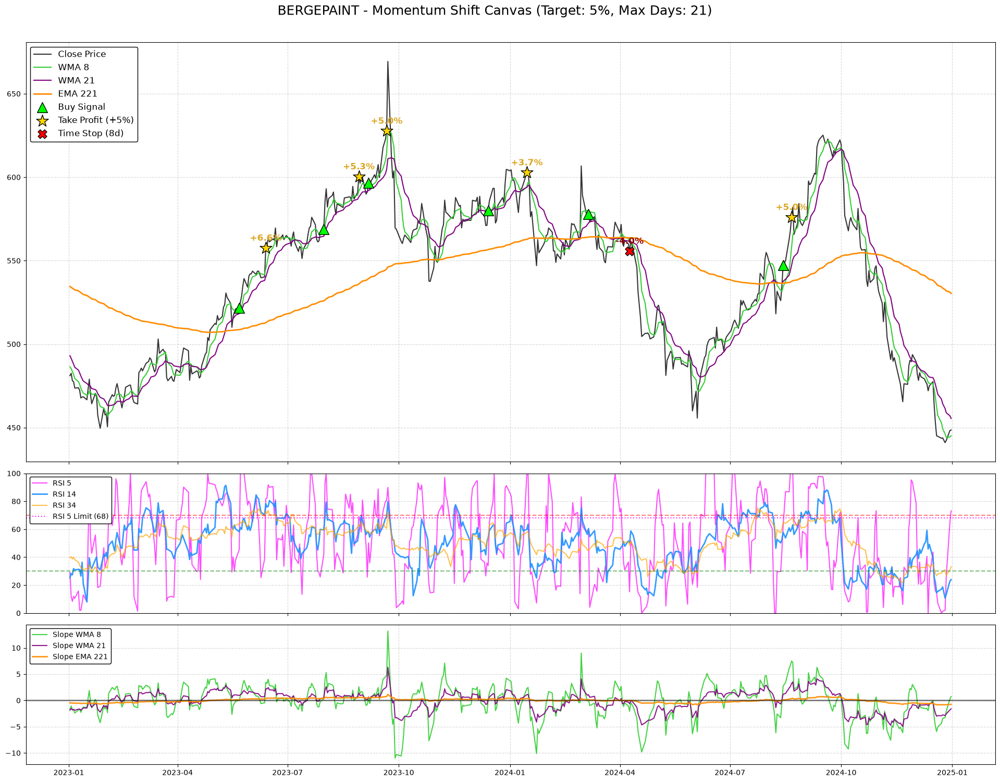

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
6,GREENPANEL,2023-09-13 00:00:00,386.95,2023-10-16 00:00:00,374.30,-3.50%,-0.062670,Time Stop (21d),64.9,67.8,58.2,353.75,345.73
7,GREENPANEL,2024-03-04 00:00:00,380.90,2024-03-11 00:00:00,347.50,-8.99%,-0.091625,Stop Loss (-7%),36.1,55.9,43.0,380.51,364.78
8,GREENPANEL,2024-08-19 00:00:00,358.30,2024-08-22 00:00:00,377.10,4.99%,-0.009210,Take Profit (+5%),38.4,59.9,58.3,334.00,338.62
9,GREENPANEL,2024-09-17 00:00:00,404.60,2024-10-17 00:00:00,412.60,1.73%,-0.080944,Time Stop (21d),46.1,55.4,60.4,364.75,347.60


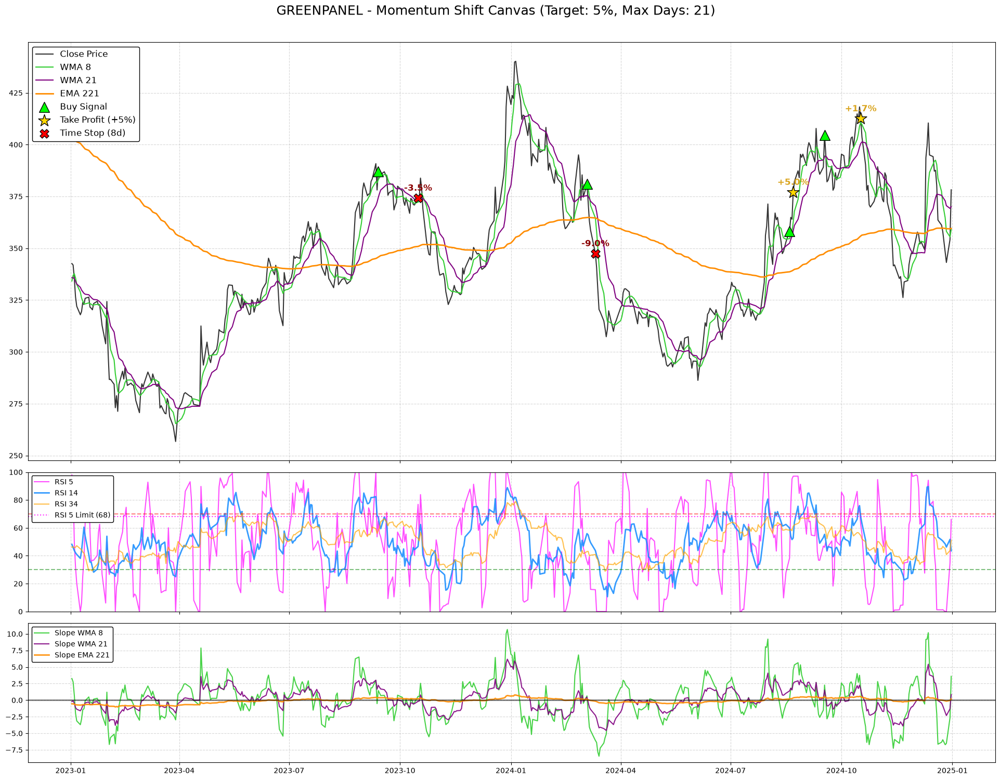

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
10,DIACABS,2024-12-12 00:00:00,166.85,2024-12-20 00:00:00,153.20,-8.40%,-0.089002,Stop Loss (-7%),44.8,66.9,48.9,155.05,115.10


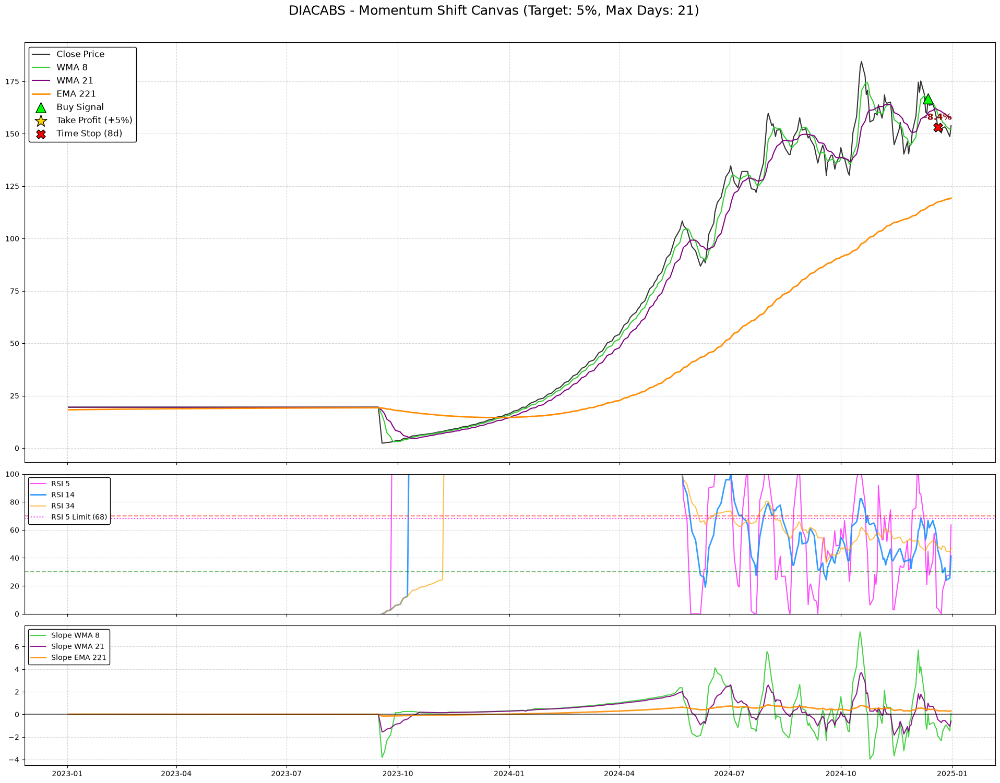

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
11,BANKBEES,2023-06-02 00:00:00,447.64,2023-07-04 00:00:00,462.23,3.01%,-0.055268,Time Stop (21d),56.4,55.4,66.2,433.39,413.09
12,BANKBEES,2023-09-01 00:00:00,452.80,2023-10-04 00:00:00,448.34,-1.22%,-0.011263,Time Stop (21d),60.4,52.8,47.7,452.21,431.02
13,BANKBEES,2024-06-07 00:00:00,509.15,2024-06-25 00:00:00,538.08,5.43%,-0.008642,Take Profit (+5%),57.0,61.8,61.0,492.67,470.80
14,BANKBEES,2024-09-10 00:00:00,526.66,2024-09-23 00:00:00,556.57,5.43%,-0.008089,Take Profit (+5%),40.2,60.8,48.1,522.04,495.17
15,BANKBEES,2024-11-05 00:00:00,534.90,2024-12-06 00:00:00,550.11,2.60%,-0.042812,Time Stop (21d),46.4,52.6,49.9,530.34,506.82


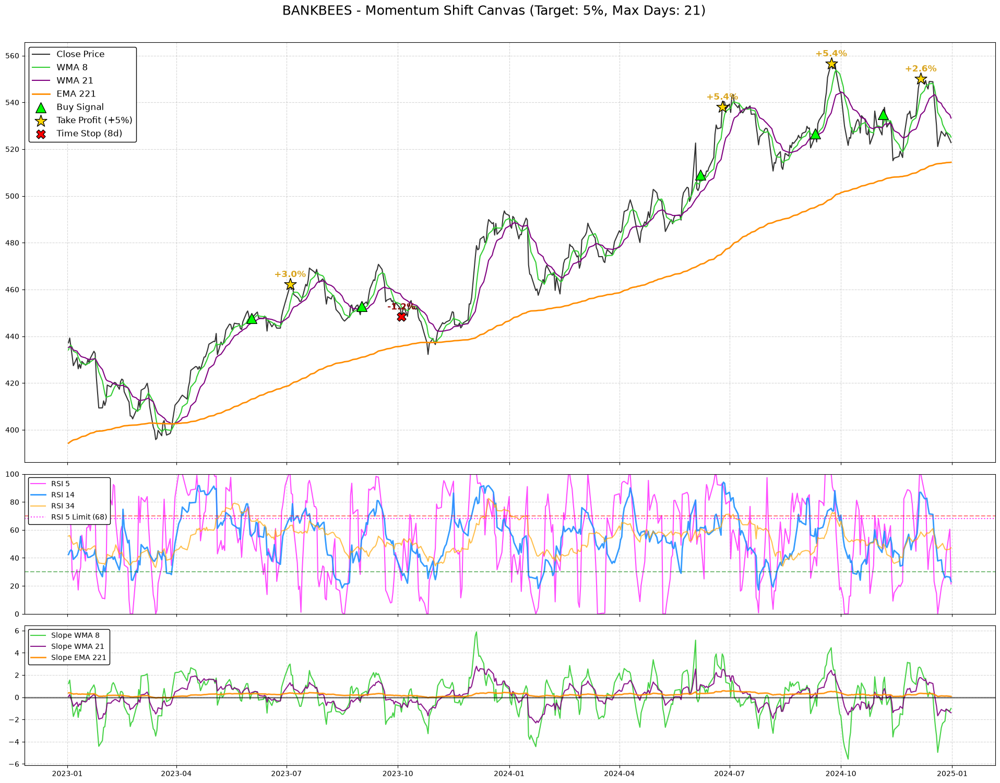

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
16,PFC,2023-02-23 00:00:00,118.04,2023-03-03 00:00:00,124.12,4.90%,-0.051847,Take Profit (+5%),36.2,60.9,44.3,117.99,102.41
17,PFC,2023-04-25 00:00:00,129.76,2023-05-02 00:00:00,138.88,6.77%,-0.004316,Take Profit (+5%),52.1,62.1,56.6,124.40,109.26
18,PFC,2023-05-15 00:00:00,136.92,2023-05-30 00:00:00,144.92,5.59%,-0.047619,Take Profit (+5%),51.6,62.6,58.8,128.29,112.09
19,PFC,2023-09-18 00:00:00,229.92,2023-09-27 00:00:00,249.65,8.32%,-0.020311,Take Profit (+5%),24.9,57.4,57.8,203.94,155.56
20,PFC,2023-10-06 00:00:00,246.30,2023-11-03 00:00:00,261.70,6.00%,-0.084450,Take Profit (+5%),52.9,67.7,59.1,217.46,164.43
21,PFC,2024-01-12 00:00:00,401.80,2024-01-29 00:00:00,446.75,10.92%,-0.056247,Take Profit (+5%),46.1,59.4,66.5,351.54,242.65
22,PFC,2024-04-22 00:00:00,404.35,2024-04-30 00:00:00,441.55,8.94%,-0.015581,Take Profit (+5%),52.7,59.1,50.5,401.15,316.94
23,PFC,2024-05-08 00:00:00,440.90,2024-05-17 00:00:00,468.10,5.91%,-0.086074,Take Profit (+5%),49.7,62.6,56.2,410.97,327.61
24,PFC,2024-07-26 00:00:00,538.95,2024-08-05 00:00:00,498.05,-7.81%,-0.089526,Stop Loss (-7%),55.5,51.9,62.7,500.62,395.54
25,PFC,2024-11-22 00:00:00,477.95,2024-12-04 00:00:00,510.00,6.45%,0.004289,Take Profit (+5%),62.5,56.9,51.4,474.41,442.36


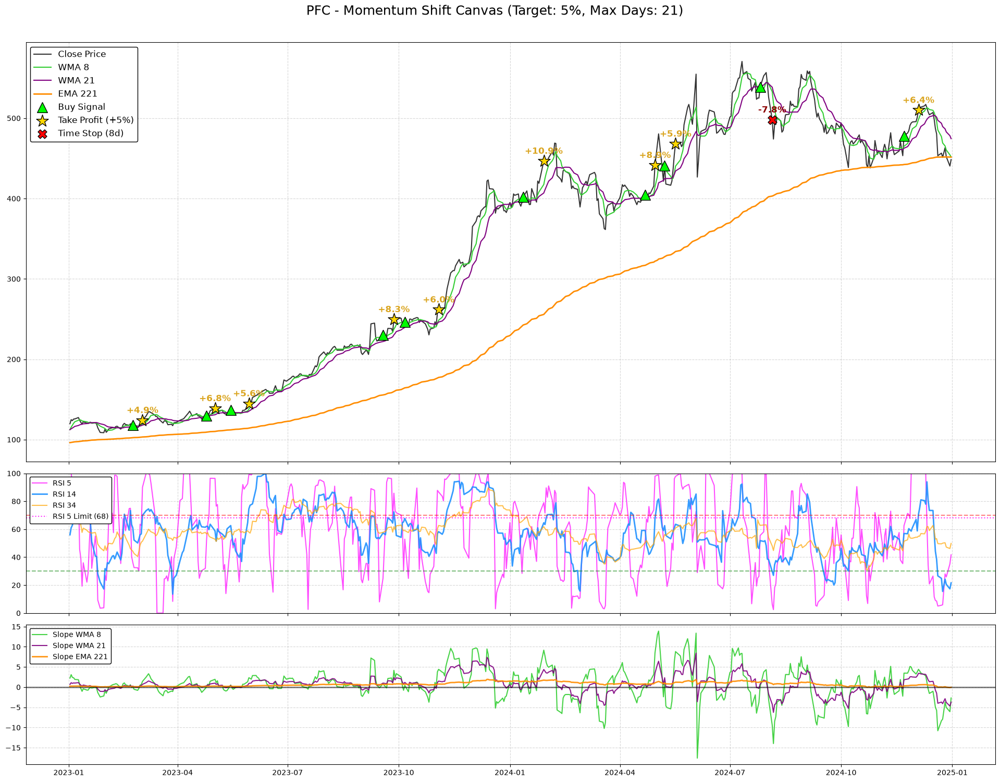

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
26,MAHLOG,2024-03-07 00:00:00,429.60,2024-03-13 00:00:00,394.55,-8.38%,-0.090200,Stop Loss (-7%),55.9,64.6,48.6,407.97,401.82
27,MAHLOG,2024-03-15 00:00:00,418.60,2024-04-08 00:00:00,470.10,12.03%,-0.045270,Take Profit (+5%),40.7,57.7,47.6,408.18,402.15
28,MAHLOG,2024-10-09 00:00:00,489.25,2024-10-23 00:00:00,444.05,-9.46%,-0.096576,Stop Loss (-7%),57.1,60.4,48.3,487.55,458.53


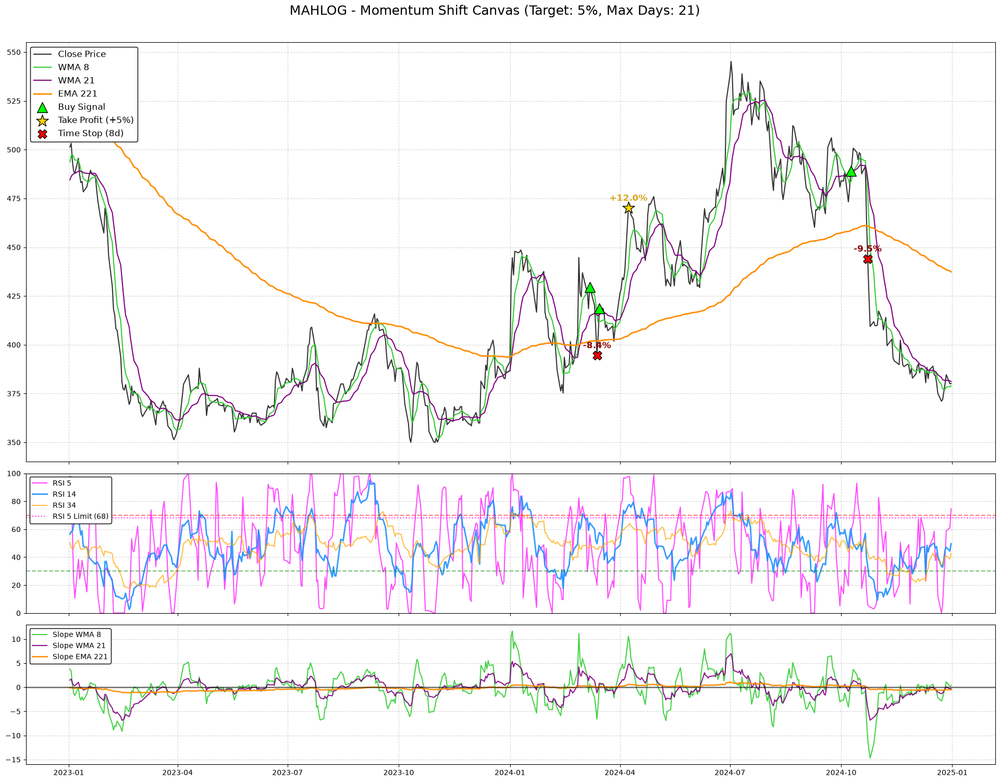

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
29,ARVINDFASN,2023-09-18 00:00:00,333.35,2023-10-13 00:00:00,350.45,4.88%,-0.069897,Take Profit (+5%),47.4,61.5,52.4,322.54,310.26
30,ARVINDFASN,2024-04-12 00:00:00,453.80,2024-04-24 00:00:00,477.75,5.03%,-0.083958,Take Profit (+5%),49.1,56.8,50.6,451.84,397.95
31,ARVINDFASN,2024-10-09 00:00:00,597.05,2024-10-15 00:00:00,634.00,5.93%,-0.009212,Take Profit (+5%),47.3,54.0,66.1,551.25,478.70


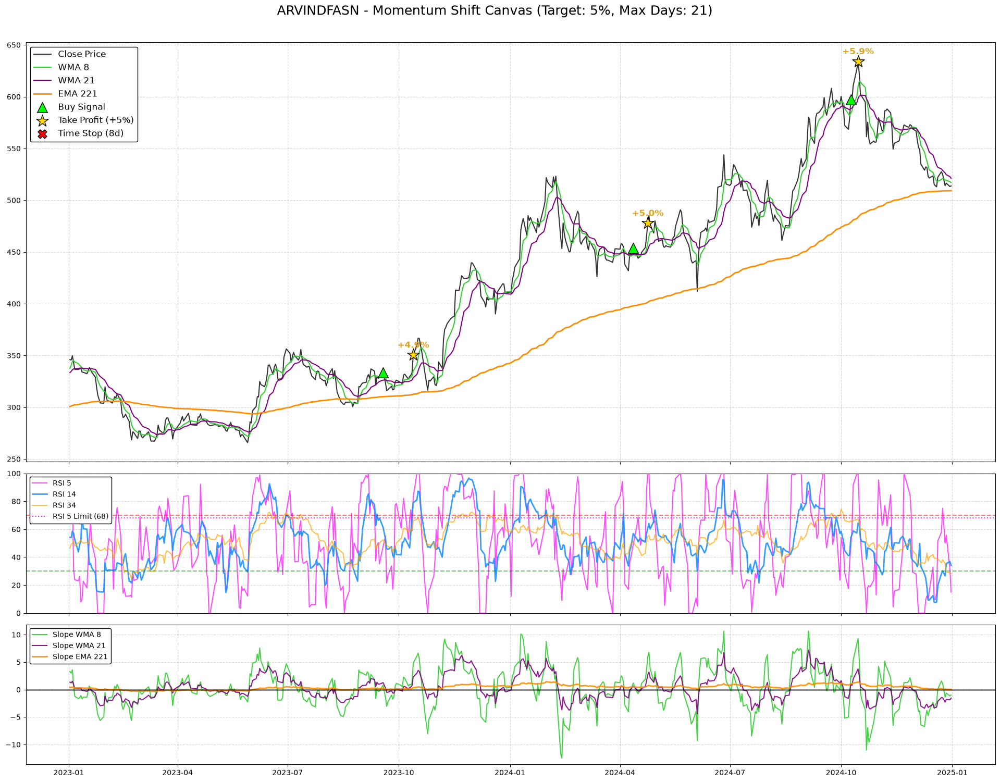

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
32,PETRONET,2023-01-17 00:00:00,219.70,2023-02-16 00:00:00,219.75,-0.22%,-0.057806,Time Stop (21d),48.9,67.7,57.0,217.44,214.47
33,PETRONET,2023-02-23 00:00:00,219.65,2023-03-09 00:00:00,230.70,4.78%,-0.003870,Take Profit (+5%),49.6,64.7,49.5,218.69,215.59
34,PETRONET,2023-03-21 00:00:00,234.65,2023-04-25 00:00:00,236.90,0.72%,-0.062220,Time Stop (21d),65.3,64.4,59.6,223.42,217.41
35,PETRONET,2023-06-21 00:00:00,225.90,2023-07-21 00:00:00,223.55,-1.28%,-0.040947,Time Stop (21d),23.6,56.6,49.1,226.55,221.94
36,PETRONET,2023-09-22 00:00:00,240.25,2023-10-09 00:00:00,223.20,-7.32%,-0.075130,Stop Loss (-7%),33.2,65.3,57.2,230.16,224.73
37,PETRONET,2024-02-15 00:00:00,277.15,2024-03-04 00:00:00,291.20,4.82%,-0.023453,Take Profit (+5%),48.7,60.9,67.9,243.57,227.83
38,PETRONET,2024-04-25 00:00:00,302.60,2024-05-02 00:00:00,320.75,5.74%,0.003470,Take Profit (+5%),52.2,66.4,57.3,276.50,245.88
39,PETRONET,2024-05-15 00:00:00,307.20,2024-06-04 00:00:00,277.90,-9.75%,-0.175130,Stop Loss (-7%),49.7,54.6,63.9,287.32,252.50
40,PETRONET,2024-06-21 00:00:00,320.25,2024-07-02 00:00:00,336.30,4.76%,-0.019516,Take Profit (+5%),44.1,58.9,49.9,299.79,263.60
41,PETRONET,2024-08-08 00:00:00,364.00,2024-09-09 00:00:00,343.05,-5.98%,-0.071429,Time Stop (21d),40.9,62.5,64.5,334.90,285.00


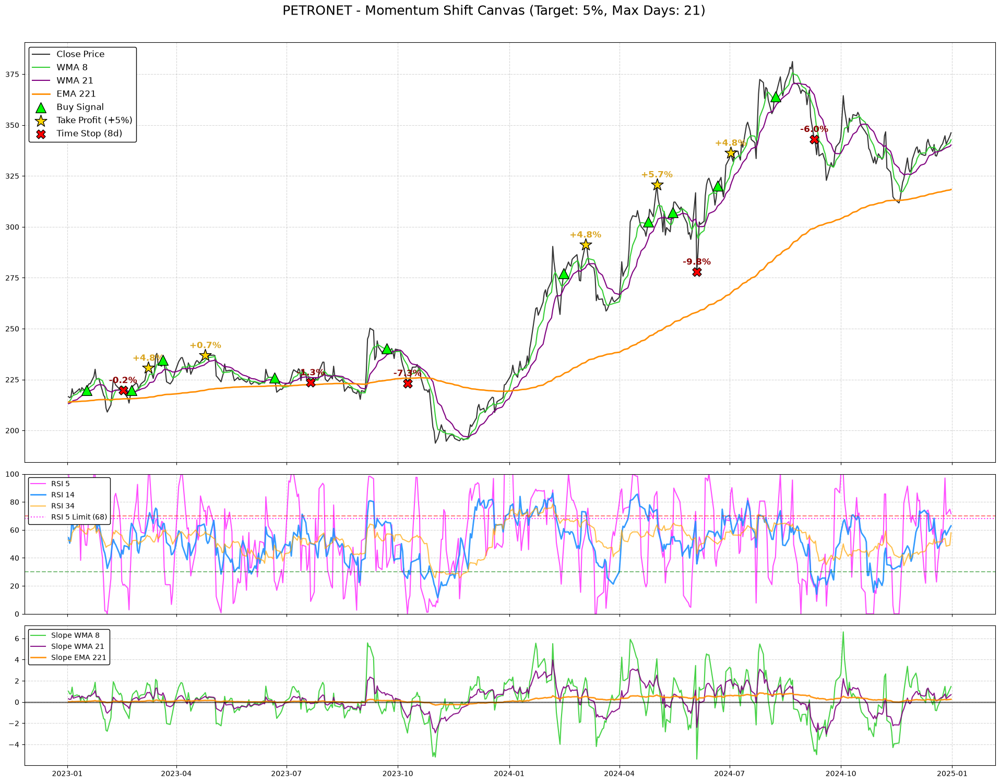

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
42,IONEXCHANG,2023-01-17 00:00:00,276.56,2023-01-24 00:00:00,255.90,-7.69%,-0.080597,Stop Loss (-7%),57.1,56.1,51.2,278.52,219.02
43,IONEXCHANG,2023-03-31 00:00:00,341.39,2023-05-04 00:00:00,360.70,5.40%,-0.058246,Take Profit (+5%),45.1,50.9,61.3,314.23,253.41
44,IONEXCHANG,2023-06-14 00:00:00,407.90,2023-07-06 00:00:00,462.00,12.99%,-0.051238,Take Profit (+5%),44.0,53.8,65.0,371.77,296.39
45,IONEXCHANG,2023-11-29 00:00:00,584.75,2023-12-29 00:00:00,562.20,-4.09%,-0.064472,Time Stop (21d),44.7,67.7,57.1,549.20,445.31
46,IONEXCHANG,2024-04-29 00:00:00,557.15,2024-05-09 00:00:00,518.05,-7.24%,-0.088037,Stop Loss (-7%),40.0,56.0,58.8,524.16,494.05
47,IONEXCHANG,2024-06-10 00:00:00,527.00,2024-06-27 00:00:00,570.40,7.98%,-0.052846,Take Profit (+5%),62.7,50.4,48.1,522.11,500.72
48,IONEXCHANG,2024-10-29 00:00:00,654.55,2024-10-31 00:00:00,702.00,6.99%,0.000000,Take Profit (+5%),66.0,57.5,46.7,648.79,587.64


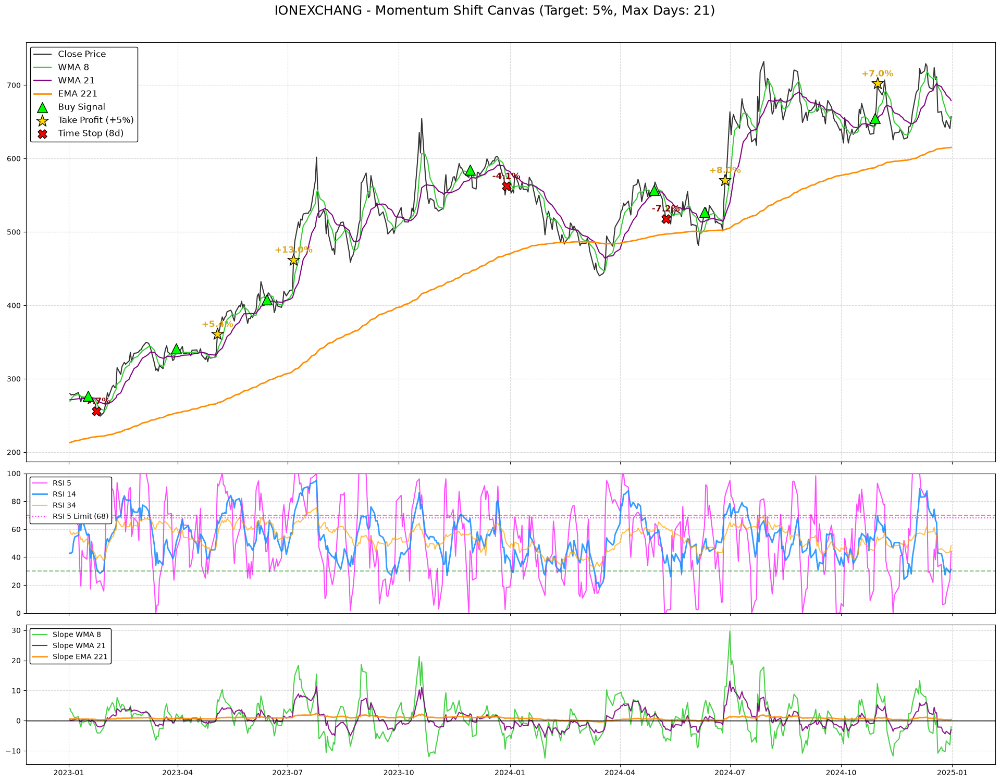

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
49,SUNTECK,2023-10-10 00:00:00,450.50,2023-10-13 00:00:00,474.30,5.03%,0.022420,Take Profit (+5%),56.7,58.7,67.7,394.57,363.00
50,SUNTECK,2024-01-18 00:00:00,458.80,2024-02-20 00:00:00,483.10,5.04%,-0.070728,Take Profit (+5%),42.9,55.4,42.2,454.27,407.87
51,SUNTECK,2024-04-23 00:00:00,438.65,2024-05-24 00:00:00,449.45,2.22%,-0.073179,Time Stop (21d),63.5,57.6,44.4,438.24,422.52
52,SUNTECK,2024-09-20 00:00:00,585.25,2024-10-22 00:00:00,555.35,-5.34%,-0.077147,Time Stop (21d),49.6,58.5,50.3,571.03,501.30


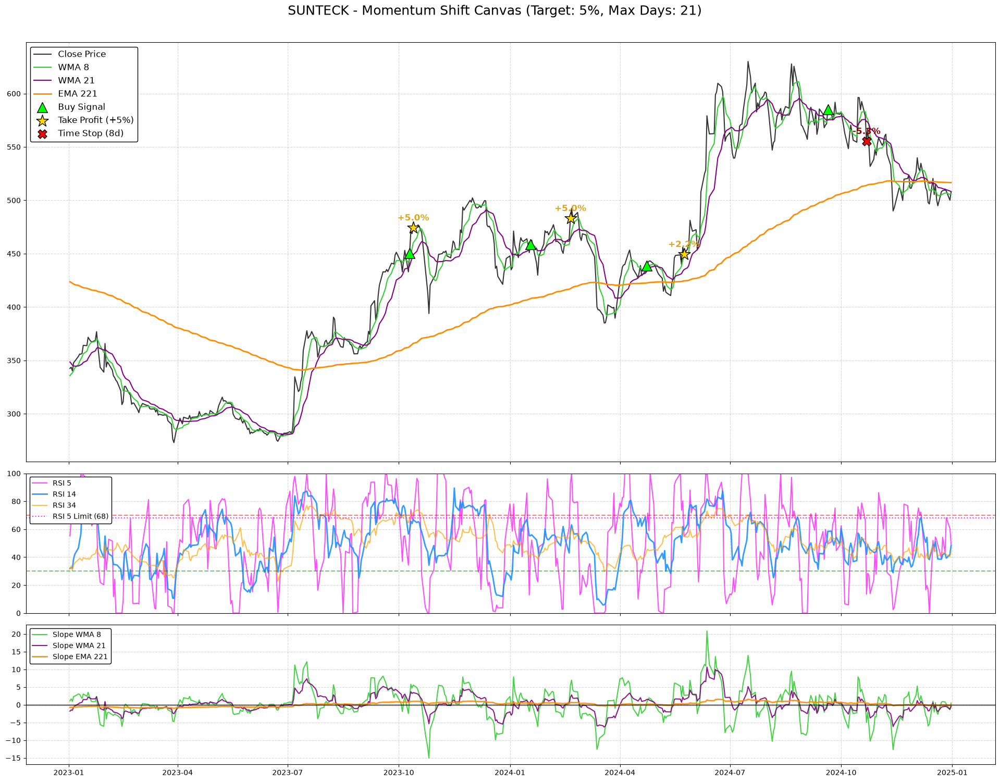

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
53,ELECON,2023-01-23 00:00:00,194.52,2023-02-17 00:00:00,207.98,6.66%,-0.075569,Take Profit (+5%),43.1,60.3,40.8,189.27,162.25
54,ELECON,2023-03-09 00:00:00,200.05,2023-03-27 00:00:00,182.40,-9.04%,-0.092727,Stop Loss (-7%),58.4,56.6,52.7,193.10,170.07
55,ELECON,2023-06-05 00:00:00,276.35,2023-06-15 00:00:00,291.50,5.23%,-0.013117,Take Profit (+5%),62.3,55.1,63.5,237.71,194.63
56,ELECON,2023-10-10 00:00:00,391.55,2023-10-12 00:00:00,413.73,5.41%,0.007407,Take Profit (+5%),41.6,58.0,44.5,384.50,293.70
57,ELECON,2023-10-20 00:00:00,403.58,2023-10-25 00:00:00,373.98,-7.56%,-0.086911,Stop Loss (-7%),28.5,58.1,44.0,389.57,301.46
58,ELECON,2023-10-27 00:00:00,394.95,2023-10-31 00:00:00,422.00,6.59%,-0.008735,Take Profit (+5%),51.2,53.6,41.0,389.15,304.48
59,ELECON,2023-12-07 00:00:00,474.15,2023-12-20 00:00:00,440.73,-7.27%,-0.087841,Stop Loss (-7%),54.2,64.9,60.7,429.98,336.39
60,ELECON,2023-12-26 00:00:00,470.12,2024-01-08 00:00:00,495.75,5.20%,-0.037490,Take Profit (+5%),65.1,51.7,55.0,439.48,348.83
61,ELECON,2024-01-24 00:00:00,529.55,2024-02-23 00:00:00,509.45,-4.03%,-0.082853,Time Stop (21d),56.2,66.9,59.9,470.30,373.13
62,ELECON,2024-09-09 00:00:00,622.65,2024-09-23 00:00:00,657.85,5.40%,-0.018630,Take Profit (+5%),52.8,59.3,48.6,611.53,529.22


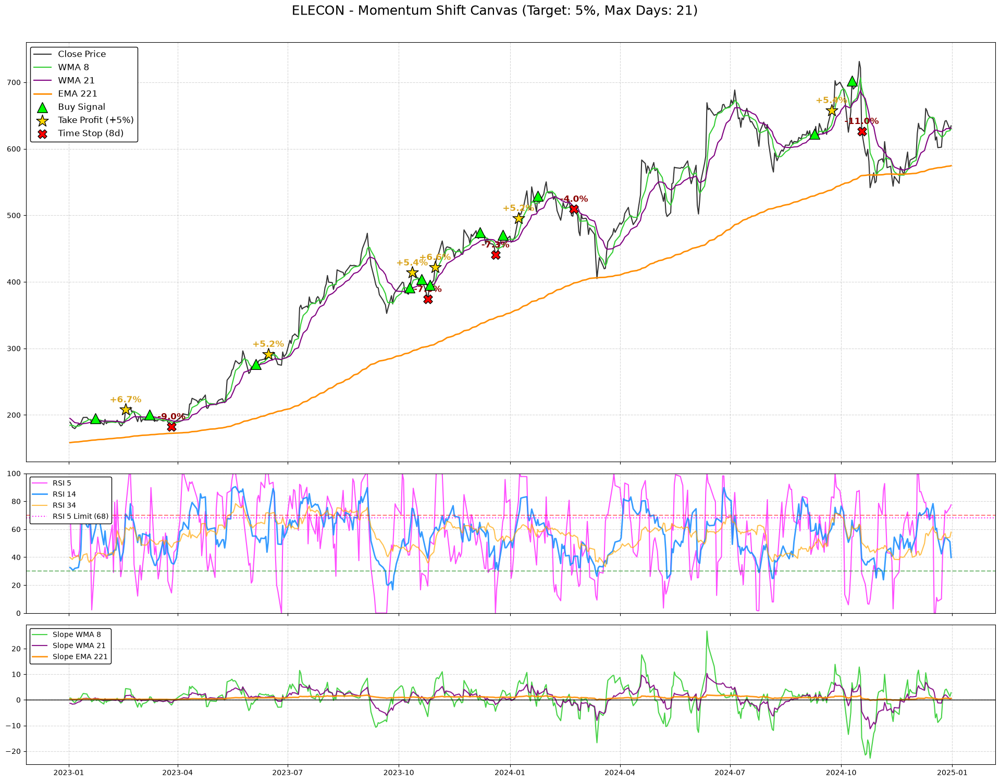

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
64,TMPV,2023-02-15 00:00:00,444.15,2023-03-15 00:00:00,411.35,-7.61%,-0.076663,Stop Loss (-7%),59.5,65.5,63.5,417.19,421.75
65,TMPV,2023-05-31 00:00:00,526.30,2023-06-06 00:00:00,555.75,5.34%,-0.006555,Take Profit (+5%),63.8,57.6,67.4,481.21,443.27
66,TMPV,2023-06-27 00:00:00,573.10,2023-07-07 00:00:00,618.20,7.61%,0.004188,Take Profit (+5%),36.3,53.1,64.2,522.92,462.27
67,TMPV,2024-03-22 00:00:00,979.80,2024-04-26 00:00:00,999.50,1.77%,-0.036538,Time Stop (21d),67.3,50.5,60.4,905.57,722.04
68,TMPV,2024-05-08 00:00:00,1012.10,2024-05-16 00:00:00,936.40,-7.70%,-0.091987,Stop Loss (-7%),52.4,55.8,55.8,966.04,784.16
69,TMPV,2024-06-27 00:00:00,972.10,2024-07-11 00:00:00,1020.80,4.76%,0.000463,Take Profit (+5%),43.4,63.6,45.7,963.62,831.30
70,TMPV,2024-07-24 00:00:00,1027.70,2024-07-25 00:00:00,1090.95,5.90%,-0.003260,Take Profit (+5%),54.2,65.6,66.2,984.36,857.51


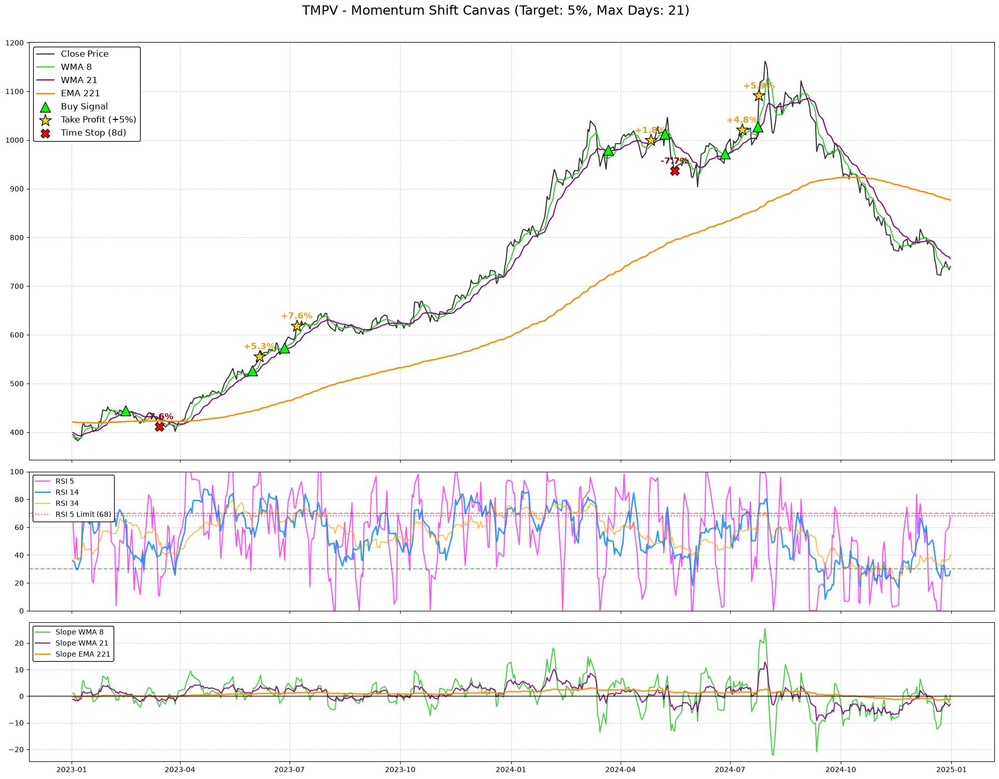

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
71,TIRUMALCHM,2023-08-21 00:00:00,203.95,2023-08-24 00:00:00,217.40,6.34%,-0.005148,Take Profit (+5%),57.7,52.7,53.1,197.20,198.91
72,TIRUMALCHM,2023-12-22 00:00:00,208.60,2023-12-26 00:00:00,226.05,8.11%,0.002876,Take Profit (+5%),37.4,57.8,56.7,204.01,203.63
73,TIRUMALCHM,2024-01-09 00:00:00,230.90,2024-01-15 00:00:00,250.20,8.10%,-0.012993,Take Profit (+5%),27.4,59.4,65.7,212.35,206.03
74,TIRUMALCHM,2024-01-18 00:00:00,238.35,2024-02-12 00:00:00,215.85,-9.66%,-0.099643,Stop Loss (-7%),44.5,63.5,62.2,218.61,208.13
75,TIRUMALCHM,2024-06-06 00:00:00,260.05,2024-06-10 00:00:00,286.20,9.79%,0.007691,Take Profit (+5%),56.8,55.0,43.7,254.74,232.40
76,TIRUMALCHM,2024-07-01 00:00:00,306.95,2024-07-08 00:00:00,322.85,4.93%,0.003421,Take Profit (+5%),52.1,59.4,60.6,275.51,241.66
77,TIRUMALCHM,2024-07-24 00:00:00,319.35,2024-07-26 00:00:00,339.10,5.93%,-0.019571,Take Profit (+5%),60.0,51.9,66.1,290.61,250.89
78,TIRUMALCHM,2024-08-09 00:00:00,335.10,2024-09-10 00:00:00,333.00,-0.86%,-0.083856,Time Stop (21d),49.6,64.1,55.7,304.82,259.19
79,TIRUMALCHM,2024-09-13 00:00:00,339.70,2024-10-07 00:00:00,304.15,-10.68%,-0.109361,Stop Loss (-7%),60.3,51.0,50.1,321.33,273.58
80,TIRUMALCHM,2024-11-19 00:00:00,323.10,2024-11-26 00:00:00,344.70,6.43%,-0.030022,Take Profit (+5%),45.4,61.1,50.0,317.00,288.28


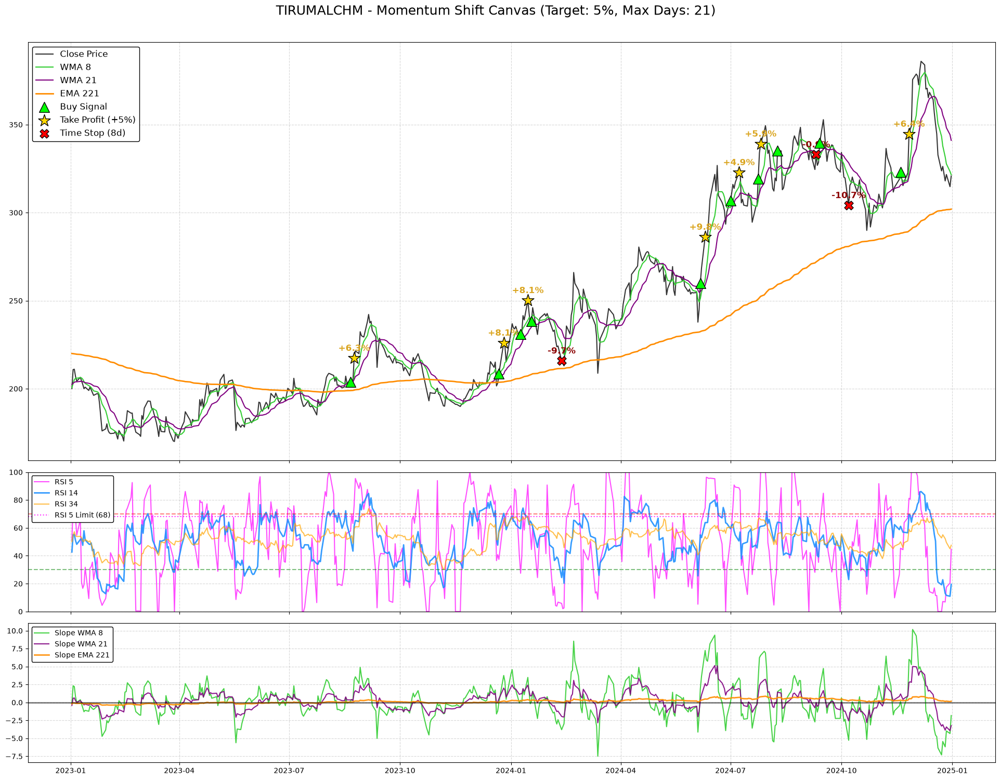

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
81,MARKSANS,2023-03-17 00:00:00,68.80,2023-03-29 00:00:00,73.60,6.72%,-0.004361,Take Profit (+5%),50.5,56.9,58.2,65.47,58.43
82,MARKSANS,2023-04-03 00:00:00,71.50,2023-04-13 00:00:00,76.90,7.29%,-0.006993,Take Profit (+5%),56.5,66.0,59.1,67.17,59.52
83,MARKSANS,2023-06-28 00:00:00,92.40,2023-07-12 00:00:00,101.65,9.75%,-0.021645,Take Profit (+5%),32.9,61.9,61.7,82.36,68.66
84,MARKSANS,2023-08-03 00:00:00,113.75,2023-09-04 00:00:00,110.05,-3.48%,-0.043956,Time Stop (21d),36.4,61.0,65.5,97.00,76.06
85,MARKSANS,2023-10-12 00:00:00,110.00,2023-10-23 00:00:00,101.15,-8.27%,-0.095455,Stop Loss (-7%),63.3,67.2,45.7,106.36,87.58
86,MARKSANS,2024-02-13 00:00:00,157.95,2024-02-16 00:00:00,166.85,5.38%,-0.018677,Take Profit (+5%),63.1,58.4,49.0,150.77,119.16
87,MARKSANS,2024-02-26 00:00:00,161.10,2024-03-06 00:00:00,147.80,-8.48%,-0.106145,Stop Loss (-7%),48.3,59.0,44.9,153.39,122.37
88,MARKSANS,2024-04-26 00:00:00,172.15,2024-05-07 00:00:00,157.90,-8.50%,-0.099622,Stop Loss (-7%),43.1,59.2,57.1,157.74,132.55
89,MARKSANS,2024-05-29 00:00:00,169.55,2024-05-30 00:00:00,146.55,-13.77%,-0.149513,Stop Loss (-7%),62.3,62.4,53.6,161.37,138.04
90,MARKSANS,2024-07-01 00:00:00,163.77,2024-07-05 00:00:00,187.99,14.51%,-0.008304,Take Profit (+5%),44.3,61.1,52.1,159.32,141.42


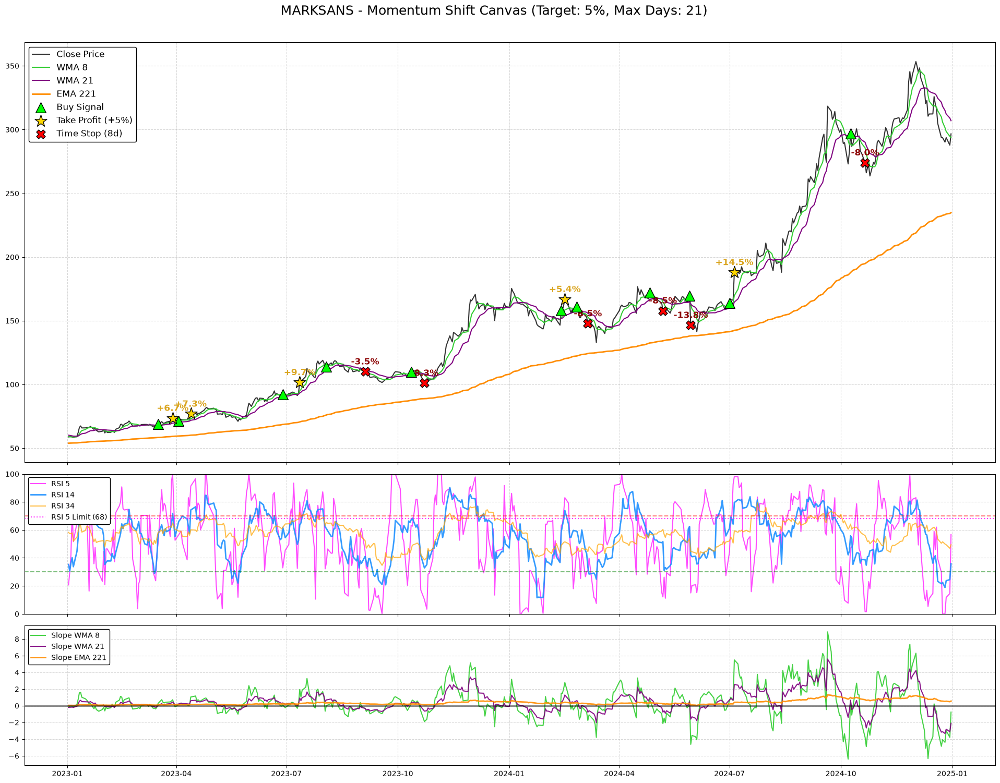

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
92,PCBL,2024-07-22 00:00:00,282.05,2024-07-29 00:00:00,299.70,6.00%,-0.081900,Take Profit (+5%),59.7,66.3,63.0,263.32,242.10


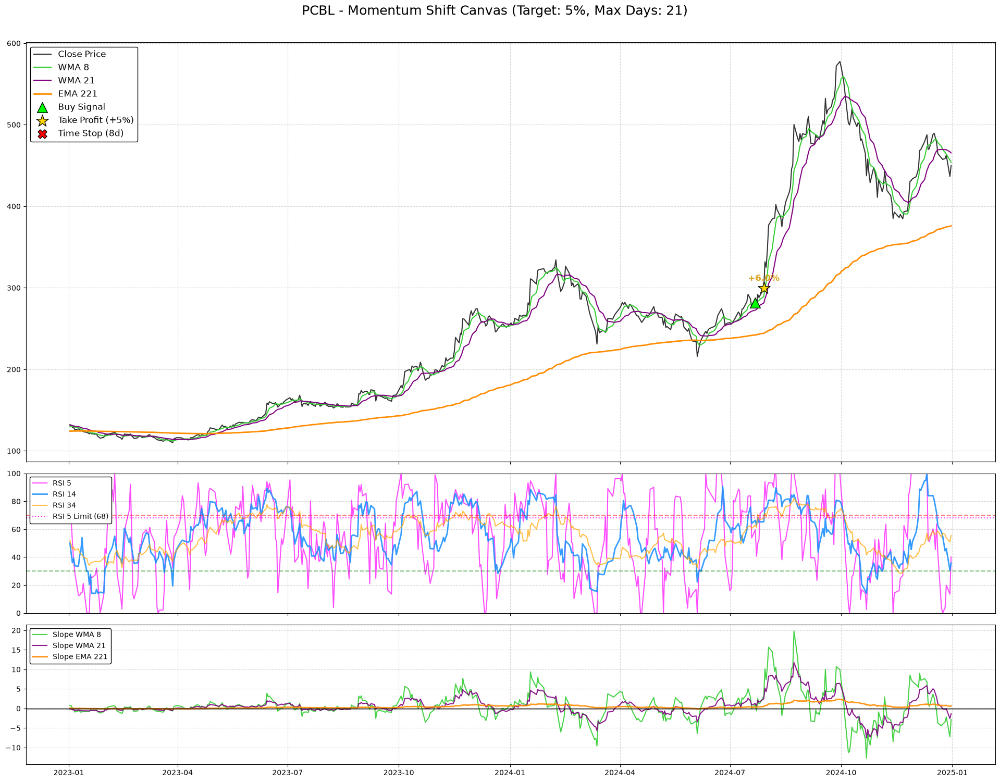

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
93,NAVA,2023-08-07 00:00:00,187.70,2023-08-10 00:00:00,198.48,5.49%,-0.021044,Take Profit (+5%),51.9,65.4,62.2,158.72,126.64
94,NAVA,2023-08-18 00:00:00,197.10,2023-08-31 00:00:00,212.50,7.55%,-0.026509,Take Profit (+5%),47.1,58.7,65.8,168.36,131.53
95,NAVA,2023-09-11 00:00:00,209.52,2023-09-21 00:00:00,225.00,7.13%,-0.077556,Take Profit (+5%),52.4,65.8,64.8,183.88,141.15
96,NAVA,2024-01-02 00:00:00,234.32,2024-02-02 00:00:00,250.85,6.80%,-0.052811,Take Profit (+5%),67.3,61.5,63.7,210.96,175.56
97,NAVA,2024-05-08 00:00:00,256.40,2024-06-06 00:00:00,292.75,13.90%,-0.111739,Take Profit (+5%),59.2,60.5,56.0,247.18,213.15
98,NAVA,2024-08-06 00:00:00,448.83,2024-08-26 00:00:00,481.42,7.01%,-0.001337,Take Profit (+5%),51.1,57.2,64.7,367.28,272.17
99,NAVA,2024-09-03 00:00:00,477.45,2024-09-12 00:00:00,516.60,7.94%,-0.005131,Take Profit (+5%),33.9,65.6,62.9,418.77,303.34


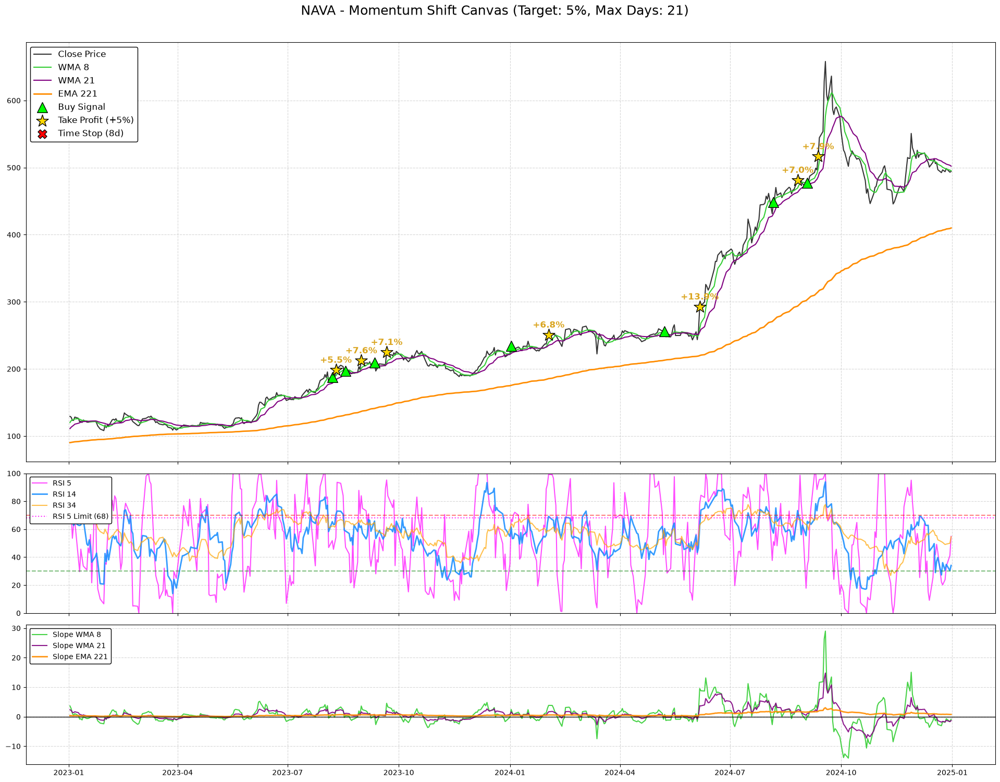

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
100,ENIL,2023-08-03 00:00:00,149.55,2023-09-04 00:00:00,155.35,3.63%,-0.030425,Time Stop (21d),56.1,62.3,61.4,135.65,141.82
101,ENIL,2024-07-09 00:00:00,256.49,2024-07-19 00:00:00,236.61,-7.97%,-0.090218,Stop Loss (-7%),63.5,66.8,55.9,244.45,225.82


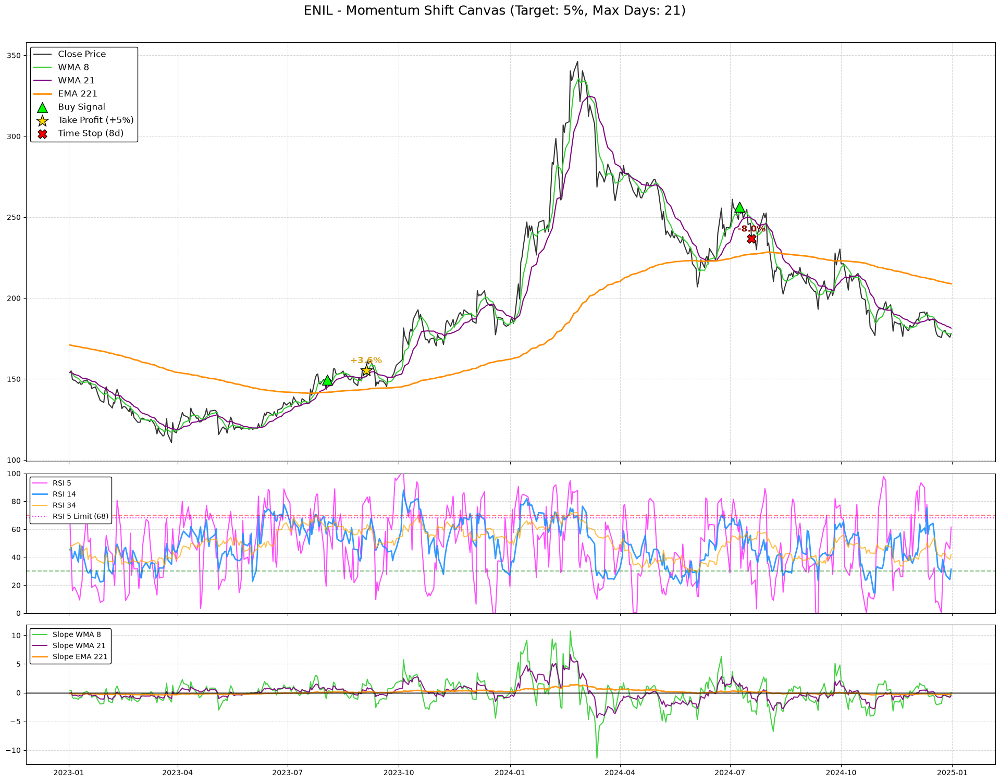

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
102,MANINFRA,2023-10-10 00:00:00,159.90,2023-10-25 00:00:00,144.50,-9.85%,-0.107567,Stop Loss (-7%),60.3,63.3,60.4,142.12,111.59
103,MANINFRA,2023-12-22 00:00:00,202.55,2023-12-29 00:00:00,216.70,6.73%,-0.003950,Take Profit (+5%),57.1,51.8,67.6,174.63,134.06
104,MANINFRA,2024-01-24 00:00:00,223.35,2024-01-29 00:00:00,238.25,6.42%,0.002910,Take Profit (+5%),53.7,58.2,62.3,198.99,148.87
105,MANINFRA,2024-06-20 00:00:00,200.26,2024-07-22 00:00:00,199.97,-0.38%,-0.051233,Time Stop (21d),43.7,56.8,43.5,200.73,182.09
106,MANINFRA,2024-08-30 00:00:00,197.20,2024-09-30 00:00:00,190.06,-3.85%,-0.065365,Time Stop (21d),40.0,63.2,48.5,196.06,187.01
107,MANINFRA,2024-10-16 00:00:00,192.76,2024-10-24 00:00:00,178.16,-7.80%,-0.091616,Stop Loss (-7%),65.5,50.2,47.6,192.32,188.00


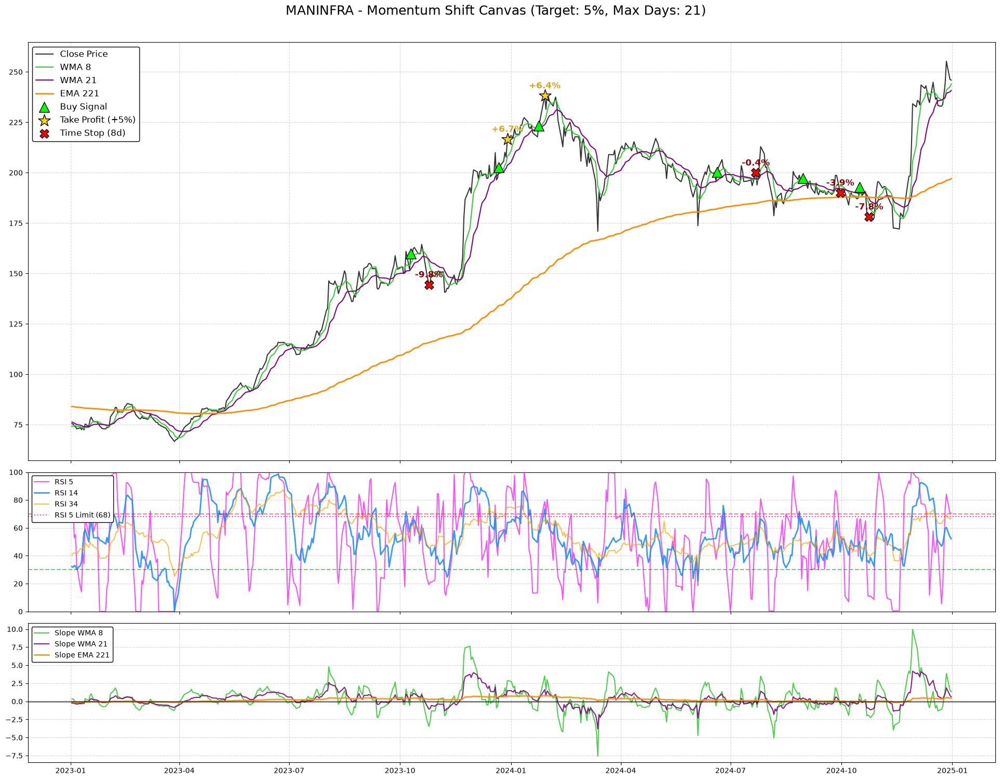

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
108,MONQ50,2023-07-11 00:00:00,53.71,2023-08-09 00:00:00,53.37,-0.87%,-0.020667,Time Stop (21d),44.5,55.1,57.3,53.16,53.56
109,MONQ50,2023-09-13 00:00:00,53.55,2023-10-16 00:00:00,53.20,-0.89%,-0.038282,Time Stop (21d),66.0,58.2,48.1,53.38,53.55
110,MONQ50,2023-11-29 00:00:00,54.00,2023-12-18 00:00:00,56.72,4.79%,-0.007222,Take Profit (+5%),51.9,65.7,57.1,53.35,53.45
111,MONQ50,2024-01-05 00:00:00,57.15,2024-02-07 00:00:00,58.16,1.52%,-0.020123,Time Stop (21d),49.2,57.6,66.7,55.08,53.99
112,MONQ50,2024-02-23 00:00:00,58.73,2024-03-14 00:00:00,61.91,5.16%,-0.033714,Take Profit (+5%),52.2,65.0,66.4,57.06,54.96
113,MONQ50,2024-04-09 00:00:00,62.13,2024-05-13 00:00:00,62.33,0.08%,-0.033800,Time Stop (21d),52.2,54.8,63.3,59.66,56.31
114,MONQ50,2024-06-03 00:00:00,63.23,2024-07-03 00:00:00,66.50,4.92%,-0.011387,Take Profit (+5%),55.8,68.0,55.8,61.67,57.94
115,MONQ50,2024-08-30 00:00:00,63.00,2024-09-30 00:00:00,64.02,1.38%,-0.039683,Time Stop (21d),65.7,61.7,32.4,64.39,61.15
116,MONQ50,2024-11-21 00:00:00,70.46,2024-11-29 00:00:00,74.40,5.34%,-0.004967,Take Profit (+5%),35.1,62.6,63.5,65.82,62.66


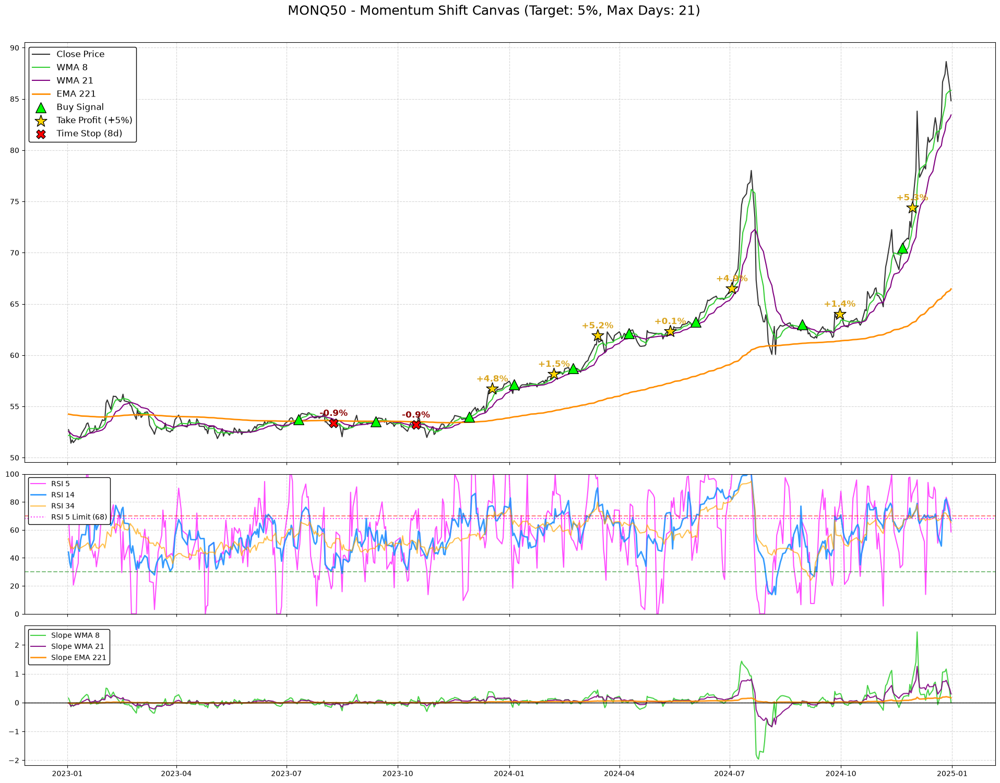

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
117,DEEPINDS,2023-06-02 00:00:00,175.75,2023-07-04 00:00:00,180.00,2.17%,-0.032717,Time Stop (21d),33.7,58.7,62.9,159.13,136.70
118,DEEPINDS,2023-09-22 00:00:00,256.65,2023-10-03 00:00:00,282.90,9.96%,0.015780,Take Profit (+5%),50.4,57.9,56.1,238.13,182.51
119,DEEPINDS,2023-10-16 00:00:00,288.85,2023-10-20 00:00:00,262.45,-9.36%,-0.100398,Stop Loss (-7%),51.6,64.8,59.8,256.27,194.93
120,DEEPINDS,2024-01-10 00:00:00,256.10,2024-02-12 00:00:00,234.35,-8.71%,-0.090590,Stop Loss (-7%),60.6,65.3,45.4,256.83,220.81
121,DEEPINDS,2024-03-15 00:00:00,262.60,2024-03-22 00:00:00,290.25,10.26%,-0.040366,Take Profit (+5%),50.5,58.0,54.4,253.55,231.24
122,DEEPINDS,2024-06-20 00:00:00,296.05,2024-07-11 00:00:00,321.25,8.25%,-0.042054,Take Profit (+5%),48.1,57.0,53.1,287.92,257.64
123,DEEPINDS,2024-08-07 00:00:00,323.10,2024-08-20 00:00:00,345.20,6.58%,-0.040390,Take Profit (+5%),55.4,56.3,58.1,301.45,269.90
124,DEEPINDS,2024-09-23 00:00:00,433.35,2024-10-09 00:00:00,458.65,5.58%,-0.072459,Take Profit (+5%),52.6,60.9,65.1,369.08,300.11
125,DEEPINDS,2024-11-22 00:00:00,504.00,2024-11-28 00:00:00,566.70,12.17%,-0.009921,Take Profit (+5%),67.6,55.9,58.0,452.65,353.23
126,DEEPINDS,2024-12-13 00:00:00,570.95,2024-12-18 00:00:00,613.50,7.19%,-0.000525,Take Profit (+5%),56.4,68.0,64.8,497.39,379.09


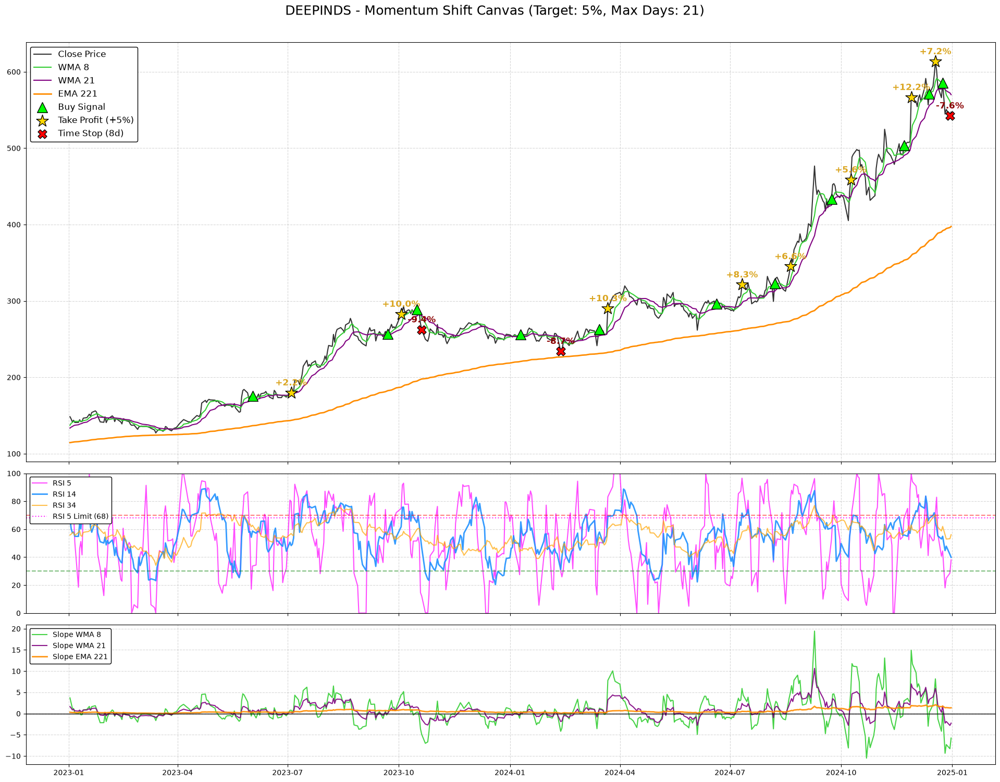

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
128,EIHOTEL,2023-02-16 00:00:00,167.35,2023-03-20 00:00:00,161.45,-3.76%,-0.070810,Time Stop (21d),41.9,57.0,49.4,171.28,162.62
129,EIHOTEL,2023-06-30 00:00:00,212.00,2023-07-31 00:00:00,212.00,-0.24%,-0.041038,Time Stop (21d),64.4,58.4,63.5,198.88,176.88
130,EIHOTEL,2023-11-28 00:00:00,239.00,2023-12-28 00:00:00,243.20,1.51%,-0.069247,Time Stop (21d),36.2,55.3,51.0,230.38,207.72
131,EIHOTEL,2024-03-14 00:00:00,420.00,2024-03-26 00:00:00,442.50,5.10%,-0.057143,Take Profit (+5%),44.7,58.5,65.7,356.28,267.67
132,EIHOTEL,2024-04-22 00:00:00,478.20,2024-05-23 00:00:00,482.30,0.62%,-0.070159,Time Stop (21d),52.5,60.7,62.2,413.91,302.77
133,EIHOTEL,2024-09-10 00:00:00,392.80,2024-10-10 00:00:00,431.40,9.56%,-0.071538,Take Profit (+5%),64.8,61.5,47.7,400.75,370.25


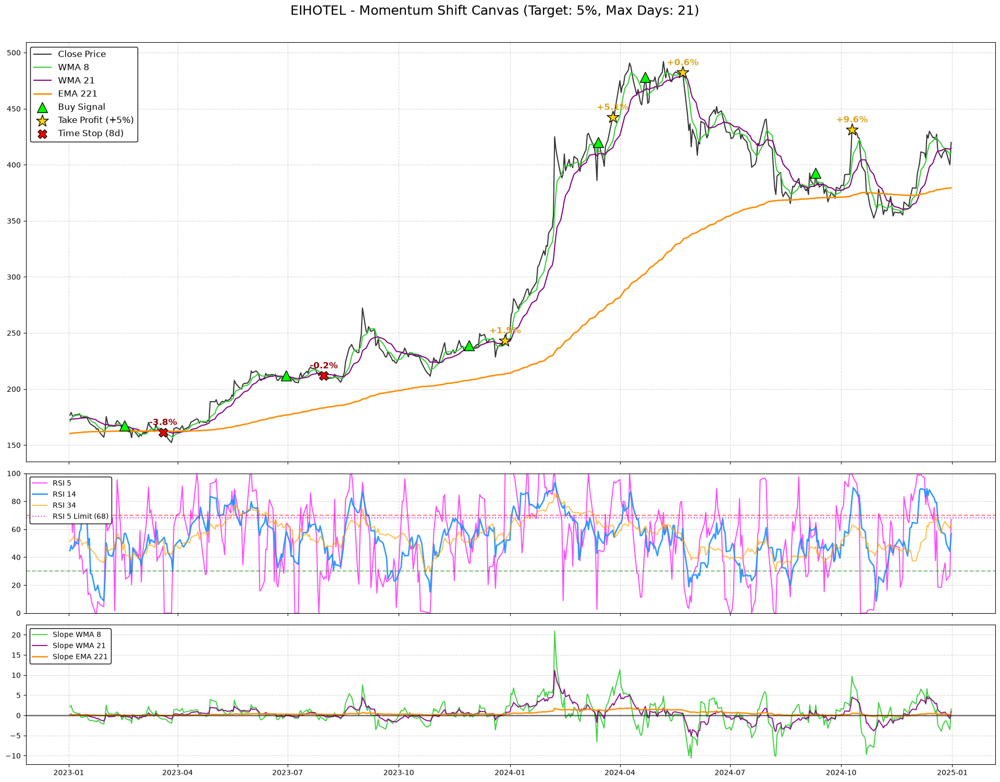

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
134,AWHCL,2023-07-19 00:00:00,319.15,2023-08-04 00:00:00,336.15,5.07%,-0.029297,Take Profit (+5%),60.2,55.5,67.7,287.17,286.43
135,AWHCL,2023-08-09 00:00:00,326.75,2023-08-21 00:00:00,351.35,7.27%,-0.042081,Take Profit (+5%),60.4,56.9,64.8,301.56,290.78
136,AWHCL,2023-08-21 00:00:00,351.35,2023-09-11 00:00:00,325.80,-7.49%,-0.077700,Stop Loss (-7%),64.4,63.8,61.4,307.69,293.11
137,AWHCL,2023-10-27 00:00:00,409.90,2023-11-10 00:00:00,453.95,10.48%,-0.079288,Take Profit (+5%),51.0,55.2,61.2,357.47,315.93
138,AWHCL,2024-01-05 00:00:00,494.65,2024-01-10 00:00:00,529.90,6.87%,-0.025574,Take Profit (+5%),61.6,61.6,52.2,450.04,367.47
139,AWHCL,2024-01-19 00:00:00,521.05,2024-01-30 00:00:00,549.50,5.21%,-0.045581,Take Profit (+5%),53.8,58.0,54.0,469.26,380.04
140,AWHCL,2024-02-06 00:00:00,536.30,2024-02-12 00:00:00,488.40,-9.15%,-0.102927,Stop Loss (-7%),42.7,55.1,59.4,488.84,393.29
141,AWHCL,2024-02-13 00:00:00,534.05,2024-02-14 00:00:00,479.80,-10.37%,-0.122367,Stop Loss (-7%),48.8,54.4,55.3,492.82,398.58
142,AWHCL,2024-04-01 00:00:00,490.95,2024-04-09 00:00:00,524.95,6.67%,0.000102,Take Profit (+5%),66.3,50.6,47.4,486.75,420.63
143,AWHCL,2024-04-22 00:00:00,508.05,2024-05-09 00:00:00,470.20,-7.67%,-0.082669,Stop Loss (-7%),52.7,67.8,48.2,494.42,430.24


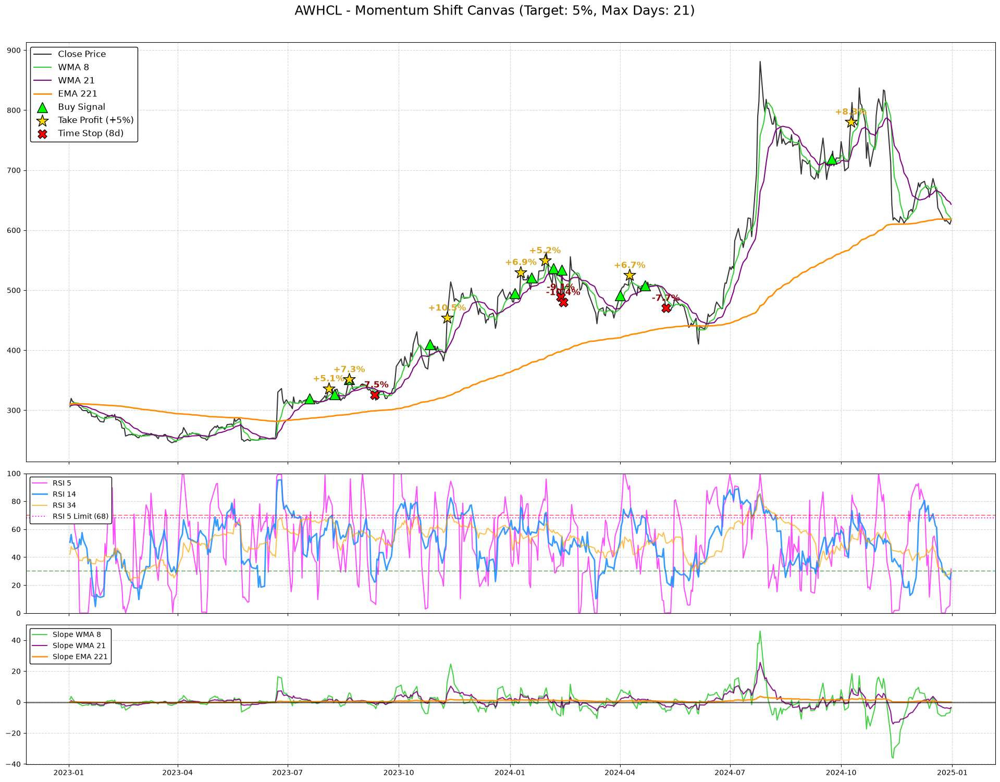

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
145,ORIENTHOT,2023-03-17 00:00:00,79.35,2023-04-11 00:00:00,83.45,4.91%,-0.038437,Take Profit (+5%),48.0,52.9,64.9,74.80,69.19
146,ORIENTHOT,2023-07-26 00:00:00,90.00,2023-08-14 00:00:00,83.30,-7.67%,-0.078333,Stop Loss (-7%),62.3,55.3,52.9,88.25,79.58
147,ORIENTHOT,2023-08-29 00:00:00,86.35,2023-09-11 00:00:00,90.95,5.07%,-0.008686,Take Profit (+5%),62.6,56.7,48.6,86.11,80.57
148,ORIENTHOT,2023-11-30 00:00:00,102.85,2023-12-01 00:00:00,114.95,11.50%,-0.001458,Take Profit (+5%),61.6,53.4,47.8,97.65,87.46
149,ORIENTHOT,2023-12-21 00:00:00,122.85,2024-01-23 00:00:00,119.85,-2.68%,-0.048026,Time Stop (21d),54.3,57.7,65.1,107.74,91.77
150,ORIENTHOT,2024-02-20 00:00:00,128.10,2024-02-23 00:00:00,137.70,7.24%,-0.016393,Take Profit (+5%),53.3,56.3,55.3,121.80,102.03
151,ORIENTHOT,2024-03-01 00:00:00,133.00,2024-03-12 00:00:00,121.30,-9.02%,-0.096617,Stop Loss (-7%),23.6,60.6,54.4,124.54,104.17
152,ORIENTHOT,2024-05-02 00:00:00,135.45,2024-05-03 00:00:00,150.00,10.48%,-0.000738,Take Profit (+5%),56.9,57.7,53.8,128.52,111.20
153,ORIENTHOT,2024-08-08 00:00:00,138.41,2024-08-22 00:00:00,146.50,5.59%,-0.048840,Take Profit (+5%),52.6,59.0,47.7,136.55,123.64
154,ORIENTHOT,2024-09-17 00:00:00,164.17,2024-09-23 00:00:00,173.64,5.51%,-0.030213,Take Profit (+5%),12.0,61.6,57.6,147.36,129.68


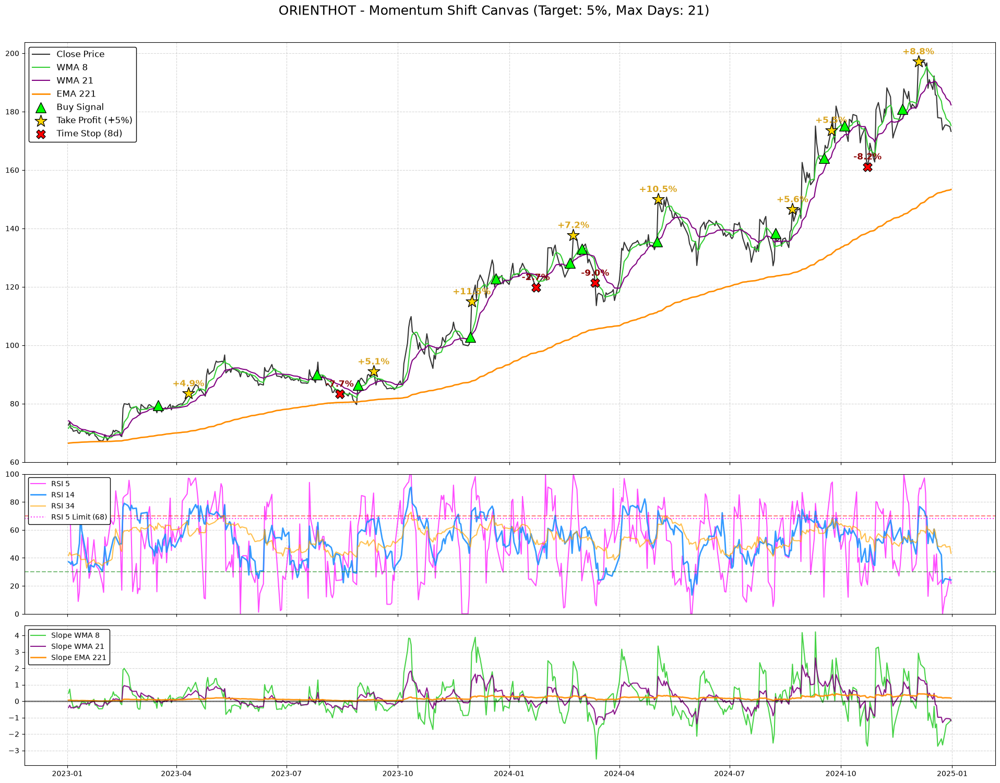

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
157,TEXRAIL,2023-12-05 00:00:00,148.75,2023-12-07 00:00:00,156.80,5.16%,0.001681,Take Profit (+5%),43.5,67.7,57.4,134.04,98.79
158,TEXRAIL,2024-01-01 00:00:00,174.00,2024-01-11 00:00:00,183.50,5.21%,-0.054598,Take Profit (+5%),52.8,65.5,67.5,150.56,109.13
159,TEXRAIL,2024-04-22 00:00:00,168.95,2024-04-24 00:00:00,178.45,5.37%,-0.000888,Take Profit (+5%),46.6,56.6,41.4,173.41,143.68
160,TEXRAIL,2024-05-14 00:00:00,174.45,2024-05-16 00:00:00,189.10,8.14%,0.004586,Take Profit (+5%),65.4,52.4,56.9,174.11,147.73
161,TEXRAIL,2024-06-21 00:00:00,215.29,2024-06-27 00:00:00,237.60,10.10%,-0.019927,Take Profit (+5%),61.6,57.6,58.0,189.48,158.25
162,TEXRAIL,2024-10-28 00:00:00,205.79,2024-10-31 00:00:00,222.27,7.75%,-0.012731,Take Profit (+5%),58.4,58.3,44.4,215.91,198.38


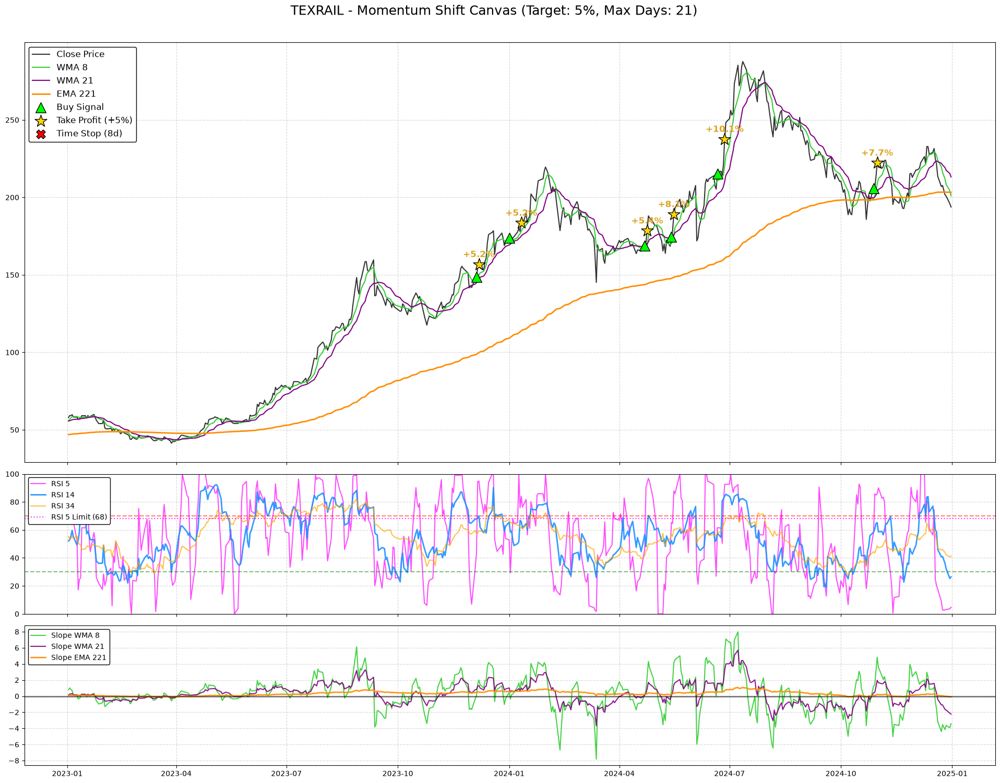

,Symbol,Entry_Date,Entry_Price,Exit_Date,Exit_Price,Return,Drawdown,Reason,Entry_RSI_5,Entry_RSI_14,Entry_RSI_34,Entry_EMA_55,Entry_EMA_221
163,OAL,2024-05-03 00:00:00,372.50,2024-05-17 00:00:00,345.00,-7.60%,-0.082416,Stop Loss (-7%),40.9,64.4,53.8,348.92,369.76
164,OAL,2024-08-02 00:00:00,459.50,2024-08-07 00:00:00,495.15,7.50%,-0.072035,Take Profit (+5%),54.1,57.5,66.5,410.52,382.13
165,OAL,2024-08-07 00:00:00,495.15,2024-08-19 00:00:00,553.75,11.57%,-0.040695,Take Profit (+5%),65.1,56.6,64.9,415.12,384.06
166,OAL,2024-09-24 00:00:00,514.50,2024-10-07 00:00:00,471.65,-8.55%,-0.095141,Stop Loss (-7%),53.5,53.6,59.4,483.67,417.75
167,OAL,2024-10-11 00:00:00,509.20,2024-10-18 00:00:00,544.60,6.70%,-0.049489,Take Profit (+5%),66.2,55.8,47.9,488.60,426.00


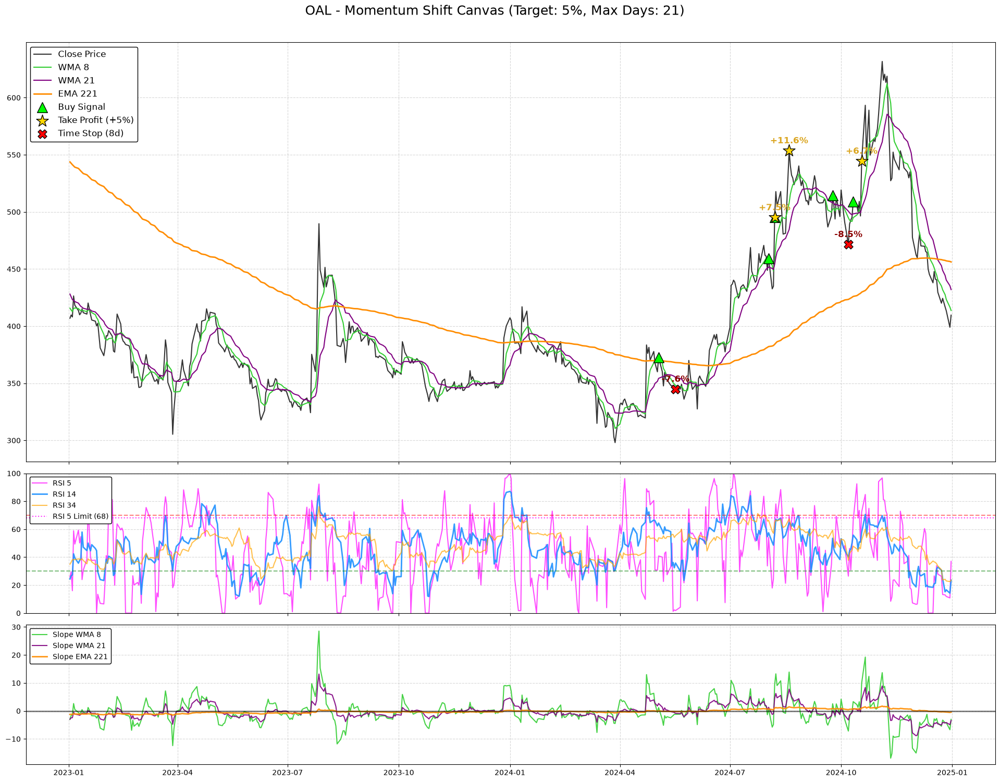

In [4]:
# 4. Interactive Matplotlib Visualizations
for df in all_data:
    symbol = df['Symbol'].iloc[0]
    trades_df = full_trades_df[full_trades_df['Symbol'] == symbol] if not full_trades_df.empty else pd.DataFrame()
    
    display(HTML(f'<br><hr><h2>{symbol} - Trade Log</h2>'))
    if not trades_df.empty:
        styled = trades_df.style.format({
            'Entry_Price': '{:.2f}', 'Exit_Price': '{:.2f}', 'Return': '{:.2%}',
            'Entry_RSI_5': '{:.1f}', 'Entry_RSI_14': '{:.1f}', 'Entry_RSI_34': '{:.1f}',
            'Entry_EMA_55': '{:.2f}', 'Entry_EMA_221': '{:.2f}'
        })
        display(styled)
    else:
        print("No trades for this stock.")
        
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, gridspec_kw={'height_ratios': [3, 1, 1]}, figsize=(24, 18), sharex=True)
    
    fig.suptitle(f'{symbol} - Momentum Shift Canvas (Target: 5%, Max Days: 21)', fontsize=18, y=0.92)
    
    # --- SUBPLOT 1: PRICE & MA ---
    ax1.plot(df['Date'], df['Close'], label='Close Price', color='black', alpha=0.8)
    ax1.plot(df['Date'], df['WMA_8'], label='WMA 8', color='limegreen', linewidth=1.5)
    ax1.plot(df['Date'], df['WMA_21'], label='WMA 21', color='purple', linewidth=1.5)
    ax1.plot(df['Date'], df['EMA_221'], label='EMA 221', color='darkorange', linewidth=2)
    
    if not trades_df.empty:
        # Plot Entries
        ax1.scatter(trades_df['Entry_Date'], trades_df['Entry_Price'], marker='^', color='lime', s=200, edgecolors='black', label='Buy Signal', zorder=5)
        
        # Plot Exits
        for _, trade in trades_df.iterrows():
            if trade['Return'] > 0:
                ax1.scatter(trade['Exit_Date'], trade['Exit_Price'], marker='*', color='gold', s=300, edgecolors='black', zorder=5)
                ax1.annotate(f"+{trade['Return']*100:.1f}%", (trade['Exit_Date'], trade['Exit_Price']), textcoords="offset points", xytext=(0,10), ha='center', color='goldenrod', weight='bold', fontsize=12)
            else:
                ax1.scatter(trade['Exit_Date'], trade['Exit_Price'], marker='X', color='red', s=150, edgecolors='black', zorder=5)
                ax1.annotate(f"{trade['Return']*100:.1f}%", (trade['Exit_Date'], trade['Exit_Price']), textcoords="offset points", xytext=(0,10), ha='center', color='darkred', weight='bold', fontsize=12)
                
    # Add dummy scatter for legend if needed
    if not trades_df.empty and len(trades_df[trades_df['Return'] > 0]) == 0:
        ax1.scatter([], [], marker='*', color='gold', s=300, edgecolors='black', label='Take Profit (+5%)')
    elif not trades_df.empty:
        ax1.scatter([], [], marker='*', color='gold', s=300, edgecolors='black', label='Take Profit (+5%)')
        
    if not trades_df.empty and len(trades_df[trades_df['Return'] <= 0]) == 0:
        ax1.scatter([], [], marker='X', color='red', s=150, edgecolors='black', label='Time Stop (8d)')
    elif not trades_df.empty:
        ax1.scatter([], [], marker='X', color='red', s=150, edgecolors='black', label='Time Stop (8d)')
                
    ax1.legend(loc='upper left', fontsize=12, facecolor='white', framealpha=1, edgecolor='black')
    ax1.grid(True, linestyle='--', alpha=0.5)
    
    # --- SUBPLOT 2: RSI ---
    ax2.plot(df['Date'], df['RSI_5'], label='RSI 5', color='magenta', alpha=0.7, linewidth=1.5)
    ax2.plot(df['Date'], df['RSI_14'], label='RSI 14', color='dodgerblue', alpha=0.9, linewidth=2)
    ax2.plot(df['Date'], df['RSI_34'], label='RSI 34', color='orange', alpha=0.7, linewidth=1.5)
    
    # RSI Zones
    ax2.axhline(70, color='red', linestyle='--', alpha=0.5)
    ax2.axhline(30, color='green', linestyle='--', alpha=0.5)
    ax2.axhline(68, color='magenta', linestyle=':', alpha=0.8, label='RSI 5 Limit (68)')
    ax2.set_ylim(0, 100)
    
    ax2.legend(loc='upper left', fontsize=10, facecolor='white', framealpha=1, edgecolor='black')
    ax2.grid(True, linestyle='--', alpha=0.5)
    
    # --- SUBPLOT 3: SLOPES ---
    ax3.plot(df['Date'], df['Slope_WMA_8'], label='Slope WMA 8', color='limegreen', alpha=0.9, linewidth=1.5)
    ax3.plot(df['Date'], df['Slope_WMA_21'], label='Slope WMA 21', color='purple', alpha=0.9, linewidth=1.5)
    ax3.plot(df['Date'], df['Slope_EMA_221'], label='Slope EMA 221', color='darkorange', alpha=0.9, linewidth=2)
    
    ax3.axhline(0, color='black', linestyle='-', linewidth=2, alpha=0.5)
    
    ax3.legend(loc='upper left', fontsize=10, facecolor='white', framealpha=1, edgecolor='black')
    ax3.grid(True, linestyle='--', alpha=0.5)
    
    plt.subplots_adjust(hspace=0.05)
    plt.show()


In [5]:
# 5. Generate Standalone HTML Report
import os

def generate_svg_sparkline(prices, entry_index=10, exit_index=15, is_win=True):
    if len(prices) == 0:
        return ""
    width = 150
    height = 40
    padding = 5
    min_p = min(prices)
    max_p = max(prices)
    price_range = max_p - min_p if max_p != min_p else 1
    
    points = []
    for i, p in enumerate(prices):
        x = padding + (i / (len(prices) - 1)) * (width - 2 * padding)
        y = height - padding - ((p - min_p) / price_range) * (height - 2 * padding)
        points.append(f"{x},{y}")
        
    path_str = " ".join(points)
    color = "#10b981" if is_win else "#ef4444"
    
    # Entry Point (Blue)
    entry_x = padding + (entry_index / (len(prices) - 1)) * (width - 2 * padding)
    entry_y = height - padding - ((prices[entry_index] - min_p) / price_range) * (height - 2 * padding)
    
    # Exit Point (Gold if win, Dark Red if loss)
    exit_x = padding + (exit_index / (len(prices) - 1)) * (width - 2 * padding)
    exit_y = height - padding - ((prices[exit_index] - min_p) / price_range) * (height - 2 * padding)
    exit_color = "#fbbf24" if is_win else "#991b1b"
    
    return f'''<svg width="{width}" height="{height}" xmlns="http://www.w3.org/2000/svg">
        <polyline points="{path_str}" fill="none" stroke="{color}" stroke-width="2" stroke-linejoin="round" />
        <circle cx="{entry_x}" cy="{entry_y}" r="3.5" fill="#3b82f6" stroke="#ffffff" stroke-width="1" />
        <circle cx="{exit_x}" cy="{exit_y}" r="3.5" fill="{exit_color}" stroke="#ffffff" stroke-width="1" />
    </svg>'''

html_trades = []
for df in all_data:
    symbol = df['Symbol'].iloc[0]
    stock_trades = full_trades_df[full_trades_df['Symbol'] == symbol]
    for _, trade in stock_trades.iterrows():
        entry_date = trade['Entry_Date']
        exit_date = trade['Exit_Date']
        # Find indices
        entry_idx = df[df['Date'] == entry_date].index[0]
        exit_idx = df[df['Date'] == exit_date].index[0]
        
        start_idx = max(0, entry_idx - 10)
        end_idx = min(len(df) - 1, exit_idx + 10)
        
        sparkline_prices = df['Close'].iloc[start_idx:end_idx+1].tolist()
        relative_entry = entry_idx - start_idx
        relative_exit = exit_idx - start_idx
        svg = generate_svg_sparkline(sparkline_prices, relative_entry, relative_exit, trade['Return'] > 0)
        
        html_trades.append({
            'Symbol': symbol,
            'Entry Date': trade['Entry_Date'].strftime('%Y-%m-%d'),
            'Entry Price': f"₹{trade['Entry_Price']:.2f}",
            'Exit Date': trade['Exit_Date'].strftime('%Y-%m-%d'),
            'Exit Price': f"₹{trade['Exit_Price']:.2f}",
            'Return': f"{trade['Return']*100:.2f}%",
            'Drawdown': f"{trade['Drawdown']*100:.2f}%",
            'Reason': trade['Reason'],
            'Sparkline': svg,
            '_raw_return': trade['Return'],
            '_raw_drawdown': trade['Drawdown']
        })

if html_trades:
    trades_df = pd.DataFrame(html_trades)
    total_trades = len(trades_df)
    
    # Calculate New Metrics
    years = 2.0
    stocks_tested = len(all_data)
    trades_per_annum = total_trades / years
    trades_per_stock_per_annum = trades_per_annum / stocks_tested if stocks_tested > 0 else 0
    
    wins = trades_df[trades_df['_raw_return'] > 0]
    losses = trades_df[trades_df['_raw_return'] <= 0]
    
    win_rate = (len(wins) / total_trades * 100) if total_trades > 0 else 0
    avg_return = trades_df['_raw_return'].mean() * 100 if total_trades > 0 else 0
    avg_loss = losses['_raw_return'].mean() * 100 if not losses.empty else 0
    
    avg_drawdown = trades_df['_raw_drawdown'].mean() * 100 if total_trades > 0 else 0
    max_drawdown = trades_df['_raw_drawdown'].min() * 100 if total_trades > 0 else 0
    median_drawdown = trades_df['_raw_drawdown'].median() * 100 if total_trades > 0 else 0
    
    take_profit_exits = len(trades_df[trades_df['Reason'].str.contains('Take Profit', na=False)])
    stop_loss_exits = len(trades_df[trades_df['Reason'].str.contains('Stop Loss', na=False)])
    time_stop_exits = len(trades_df[trades_df['Reason'].str.contains('Time Stop', na=False)])
    
    tp_pct = (take_profit_exits / total_trades * 100) if total_trades > 0 else 0
    sl_pct = (stop_loss_exits / total_trades * 100) if total_trades > 0 else 0
    ts_pct = (time_stop_exits / total_trades * 100) if total_trades > 0 else 0
    
    display_df = trades_df.drop(columns=['_raw_return', '_raw_drawdown'])
    table_html = display_df.to_html(escape=False, index=False, classes="min-w-full divide-y divide-gray-200")
    
    html = f"""
    <!DOCTYPE html>
    <html lang="en">
    <head>
        <meta charset="UTF-8">
        <meta name="viewport" content="width=device-width, initial-scale=1.0">
        <title>Momentum Shift Trade Report</title>
        <script src="https://cdn.tailwindcss.com"></script>
        <style>
            .Take.Profit {{ background-color: #d1fae5; color: #065f46; padding: 2px 8px; border-radius: 999px; font-size: 0.875rem; }}
            .Stop.Loss {{ background-color: #fee2e2; color: #991b1b; padding: 2px 8px; border-radius: 999px; font-size: 0.875rem; }}
            .Time.Stop {{ background-color: #fef3c7; color: #92400e; padding: 2px 8px; border-radius: 999px; font-size: 0.875rem; }}
            table td, table th {{ padding: 12px 16px; text-align: left; vertical-align: middle; }}
            tbody tr:hover {{ background-color: #f9fafb; }}
            th {{ background-color: #f3f4f6; font-weight: 600; text-transform: uppercase; font-size: 0.75rem; letter-spacing: 0.05em; color: #6b7280; cursor: pointer; }}
            th:hover {{ background-color: #e5e7eb; }}
            td {{ white-space: nowrap; }}
        </style>
    </head>
    <body class="bg-gray-50 p-8 font-sans text-gray-800">
        <div class="max-w-7xl mx-auto">
            <h1 class="text-4xl font-extrabold mb-2 text-gray-900">Momentum Shift Strategy Report</h1>
            <p class="text-gray-500 mb-8">
                <b>Period:</b> 2 Years (Jan 2023 - Dec 2024) | 
                <b>Stocks Tested:</b> {stocks_tested} | 
                <b>Price Filter:</b> ₹90 - ₹600 | 
                <b>Fees:</b> 0.24% Round-Trip
            </p>
            
            <div class="grid grid-cols-2 md:grid-cols-4 gap-4 mb-10">
                <div class="bg-white rounded-xl shadow-sm border border-gray-100 p-4">
                    <h3 class="text-xs font-medium text-gray-500 uppercase tracking-wider mb-1">Total Trades</h3>
                    <p class="text-2xl font-bold text-indigo-600">{total_trades}</p>
                </div>
                <div class="bg-white rounded-xl shadow-sm border border-gray-100 p-4">
                    <h3 class="text-xs font-medium text-gray-500 uppercase tracking-wider mb-1">Win Rate</h3>
                    <p class="text-2xl font-bold text-emerald-500">{win_rate:.2f}%</p>
                </div>
                <div class="bg-white rounded-xl shadow-sm border border-gray-100 p-4">
                    <h3 class="text-xs font-medium text-gray-500 uppercase tracking-wider mb-1">Avg Net Return</h3>
                    <p class="text-2xl font-bold text-blue-500">{avg_return:.2f}%</p>
                </div>
                <div class="bg-white rounded-xl shadow-sm border border-gray-100 p-4">
                    <h3 class="text-xs font-medium text-gray-500 uppercase tracking-wider mb-1">Avg Loss</h3>
                    <p class="text-2xl font-bold text-red-500">{avg_loss:.2f}%</p>
                </div>
                
                <div class="bg-white rounded-xl shadow-sm border border-gray-100 p-4">
                    <h3 class="text-xs font-medium text-gray-500 uppercase tracking-wider mb-1">Target Hits (+5%)</h3>
                    <p class="text-2xl font-bold text-emerald-600">{tp_pct:.1f}%</p>
                </div>
                <div class="bg-white rounded-xl shadow-sm border border-gray-100 p-4">
                    <h3 class="text-xs font-medium text-gray-500 uppercase tracking-wider mb-1">Stop Loss (-7%)</h3>
                    <p class="text-2xl font-bold text-red-500">{sl_pct:.1f}%</p>
                </div>
                <div class="bg-white rounded-xl shadow-sm border border-gray-100 p-4">
                    <h3 class="text-xs font-medium text-gray-500 uppercase tracking-wider mb-1">Time Stop Exits</h3>
                    <p class="text-2xl font-bold text-orange-500">{ts_pct:.1f}%</p>
                </div>
                <div class="bg-white rounded-xl shadow-sm border border-gray-100 p-4">
                    <h3 class="text-xs font-medium text-gray-500 uppercase tracking-wider mb-1">Trades / Year</h3>
                    <p class="text-2xl font-bold text-gray-700">{trades_per_annum:.1f}</p>
                </div>
                
                <div class="bg-white rounded-xl shadow-sm border border-gray-100 p-4">
                    <h3 class="text-xs font-medium text-gray-500 uppercase tracking-wider mb-1">Avg Drawdown</h3>
                    <p class="text-2xl font-bold text-gray-600">{avg_drawdown:.2f}%</p>
                </div>
                <div class="bg-white rounded-xl shadow-sm border border-gray-100 p-4">
                    <h3 class="text-xs font-medium text-gray-500 uppercase tracking-wider mb-1">Median Drawdown</h3>
                    <p class="text-2xl font-bold text-gray-600">{median_drawdown:.2f}%</p>
                </div>
                <div class="bg-white rounded-xl shadow-sm border border-gray-100 p-4">
                    <h3 class="text-xs font-medium text-gray-500 uppercase tracking-wider mb-1">Max Drawdown</h3>
                    <p class="text-2xl font-bold text-red-600">{max_drawdown:.2f}%</p>
                </div>
            </div>
            
            <div class="bg-white rounded-xl shadow-sm border border-gray-100 overflow-hidden">
                <div class="px-6 py-4 border-b border-gray-100 bg-white">
                    <h2 class="text-lg font-semibold text-gray-800">Detailed Trade Log</h2>
                </div>
                <div class="overflow-x-auto">
                    {table_html.replace('Take Profit', '<span class="Take Profit">Take Profit</span>').replace('Time Stop', '<span class="Time Stop">Time Stop</span>').replace('Stop Loss', '<span class="Stop Loss">Stop Loss</span>')}
                </div>
            </div>
        </div>
        <script>
            const getCellValue = (tr, idx) => tr.children[idx].innerText || tr.children[idx].textContent;
            const comparer = (idx, asc) => (a, b) => ((v1, v2) => 
                v1 !== '' && v2 !== '' && !isNaN(v1) && !isNaN(v2) ? v1 - v2 : v1.toString().localeCompare(v2)
                )(getCellValue(asc ? a : b, idx).replace(/[₹%,]/g, ''), getCellValue(asc ? b : a, idx).replace(/[₹%,]/g, ''));
            
            document.querySelectorAll('th').forEach(th => th.addEventListener('click', function() {{
                const table = th.closest('table');
                const tbody = table.querySelector('tbody');
                Array.from(tbody.querySelectorAll('tr'))
                    .sort(comparer(Array.from(th.parentNode.children).indexOf(th), this.asc = !this.asc))
                    .forEach(tr => tbody.appendChild(tr));
            }}));
        </script>
    </body>
    </html>
    """
    
    os.makedirs('../output', exist_ok=True)
    with open('../output/momentum_shift_report.html', 'w', encoding='utf-8') as f:
        f.write(html)
    print("HTML Report successfully generated at output/momentum_shift_report.html")
else:
    print("No trades found.")


HTML Report successfully generated at output/momentum_shift_report.html
